#GAN(Generative Adversarial Network):
Generative Adversarial Networks, or GANs for short, are an approach to generative modeling using deep learning methods, such as convolutional neural networks.

Generative modeling is an unsupervised learning task in machine learning that involves automatically discovering and learning the regularities or patterns in input data in such a way that the model can be used to generate or output new examples that plausibly could have been drawn from the original dataset.

GANs are a clever way of training a generative model by framing the problem as a supervised learning problem with two sub-models,the first one is generator model by which we can train to generate new examples and the second one is discriminator model by which we can classify the examples as real (from the domain) or fake (generated). The two models are trained together in a zero-sum game, adversarial, until the discriminator model is fooled about half the time, meaning the generator model is generating plausible examples.

GANs are an exciting and rapidly changing field, delivering on the promise of generative models in their ability to generate realistic examples across a range of problem domains, most notably in image-to-image translation tasks such as translating photos of summer to winter or day to night, and in generating photorealistic photos of objects, scenes, and people that even humans cannot tell are fake.

#DATASET
We can usees the opendatasets library to download the dataset from Kaggle. opendatasets uses the Kaggle Official API for downloading datasets from Kaggle. Follow these steps to find your API credentials:

1. Sign in to https://kaggle.com/, then click on your profile picture on the top right and select "My Account" from the menu.

2. Scroll down to the "API" section and click "Create New API Token". This will download a file kaggle.json with the following contents:

  {"username":"YOUR_KAGGLE_USERNAME","key":"YOUR_KAGGLE_KEY"}
3. When you run opendatsets.download, you will be asked to enter your username & Kaggle API, which you can get from the file downloaded in step 2.
Note that you need to download the kaggle.json file only once. On Google Colab, you can also upload the kaggle.json file using the files tab, and the credentials will be read automatically.



In [1]:
!pip install opendatasets --upgrade --quiet

In [2]:
import opendatasets as od

In [3]:
dataset_url = 'https://www.kaggle.com/ikarus777/best-artworks-of-all-time'

In [4]:
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

  thomaskosch


Your Kaggle Key:

  ································


100%|██████████████████████████████████████| 2.29G/2.29G [03:26<00:00, 11.9MB/s]


#Import the dataset into PyTorch
###This dataset is comprised of 2 folders:
images: This folder contains all image files within folders of artists.
resized: This folder contains all image files within one folder.
As a GAN classifies the data as real or fake, the artist categories are not needed so I will only use the files in the resized folder.
Use the ImageFolder class from torchvision.


In [5]:
image_dir = 'best-artworks-of-all-time/resized/resized/'
data_dir = 'best-artworks-of-all-time/resized/'

In [6]:
import os

In [7]:
len(os.listdir(image_dir))

8683

In [8]:
from torchvision.datasets import ImageFolder

In [9]:
dataset = ImageFolder(data_dir)

In [10]:
len(dataset)

8683

In [11]:
import matplotlib.pyplot as plt
%matplotlib inline

#Let's see some of art pictures present in dataset.

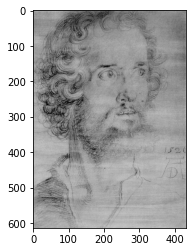

In [12]:
img, label = dataset[0]
plt.imshow(img)

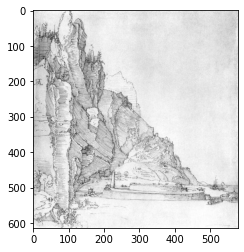

In [13]:
img, label = dataset[500]
plt.imshow(img)

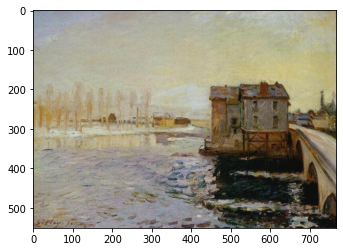

In [14]:
img, label = dataset[741]
plt.imshow(img)

#Making batches of picture:

1.   First I'll resize and center crop all images to ensure that they are all in same shape and size.

2. Then convert them to tensors and normalize them.
3. Then create the data loader.
4. Then look at some samples.



In [15]:
import torchvision.transforms as tt
from torch.utils.data import DataLoader

In [16]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [17]:
train_ds = ImageFolder(data_dir, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [18]:
from torchvision.utils import make_grid

In [19]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [20]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

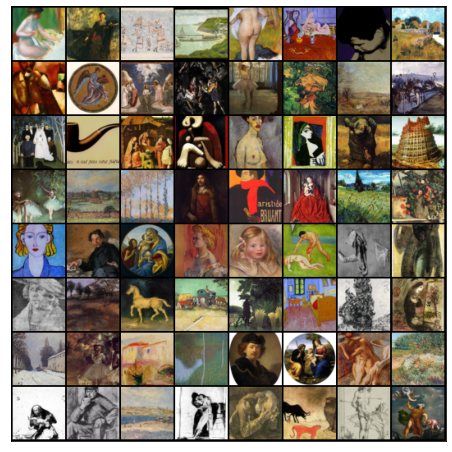

In [21]:
show_batch(train_dl)

#Using a GPU
To seamlessly use a GPU, if one is available, we define a couple of helper functions (get_default_device & to_device) and a helper class "DeviceDataLoader" to move our model & data to the GPU, if one is available.

In [22]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [23]:
import torch

In [24]:
device = get_default_device()
device

device(type='cpu')

In [25]:
train_dl = DeviceDataLoader(train_dl, device)

#Discriminator Network
The discriminator takes  image as an input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. We'll use a convolutional neural networks (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

In [26]:
import torch.nn as nn

In [27]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [28]:
discriminator = to_device(discriminator, device)

#Generator Network
The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape (128, 1, 1) into an image tensor of shape 3 x 28 x 28. To achive this, we'll use the ConvTranspose2d layer from PyTorch, which is performs to as a transposed convolution (also referred to as a deconvolution)

In [29]:
latent_size = 128

In [30]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

#Let's see how our first generative image look's like .

torch.Size([128, 3, 64, 64])


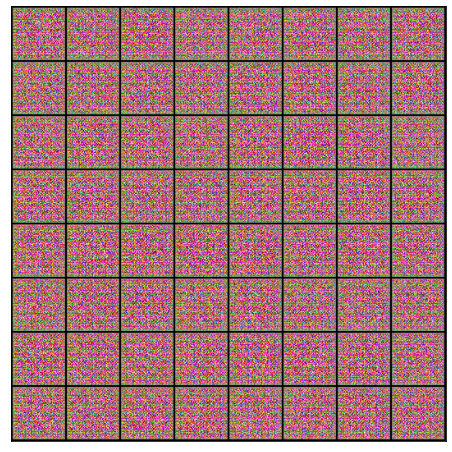

In [31]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

It seems like it's really poor.So for that now we have to train our model.

In [32]:
generator = to_device(generator, device)

#Discriminator Training
Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

###Here are the steps involved in training the discriminator.

1. We expect the discriminator to output 1 if the image was picked from the real MNIST dataset, and 0 if it was generated using the generator network.

2. We first pass a batch of real images, and compute the loss, setting the target labels to 1.

3. Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0.

4. Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (opt_d only affects the discriminator.parameters())

In [33]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

#Generator Training
Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

1. We generate a batch of images using the generator, pass it into the discriminator.

2. We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator.

3. We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

In [34]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [35]:
from torchvision.utils import save_image

In [36]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [37]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [38]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


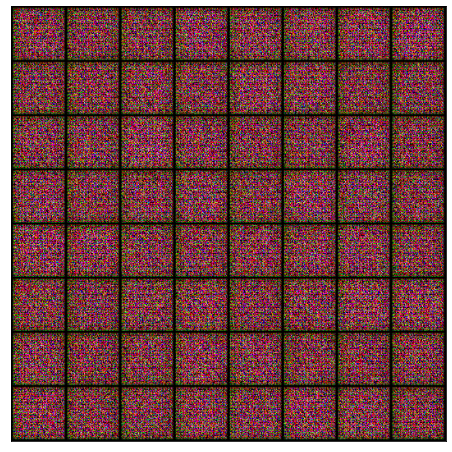

In [39]:
save_samples(0, fixed_latent)


## Full Training Loop

Let's define a fit function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.

<img src="https://i.imgur.com/6NMdO9u.png" style="max-width:420px; margin-bottom:32px"/>


In [40]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [41]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [47]:
lr = 0.0002
epochs = 600

In [48]:
history = fit(epochs, lr)

  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [1/600], loss_g: 8.3664, loss_d: 0.7856, real_score: 0.5611, fake_score: 0.0020
Saving generated-images-0001.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [2/600], loss_g: 6.1887, loss_d: 1.9890, real_score: 0.9609, fake_score: 0.7709
Saving generated-images-0002.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [3/600], loss_g: 2.3237, loss_d: 0.6978, real_score: 0.7565, fake_score: 0.3147
Saving generated-images-0003.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [4/600], loss_g: 3.0123, loss_d: 0.5824, real_score: 0.6327, fake_score: 0.0597
Saving generated-images-0004.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [5/600], loss_g: 2.9743, loss_d: 0.7015, real_score: 0.6487, fake_score: 0.1417
Saving generated-images-0005.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [6/600], loss_g: 2.6256, loss_d: 0.5280, real_score: 0.7628, fake_score: 0.1914
Saving generated-images-0006.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [7/600], loss_g: 4.6735, loss_d: 0.6245, real_score: 0.8514, fake_score: 0.3331
Saving generated-images-0007.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [8/600], loss_g: 3.7844, loss_d: 0.4887, real_score: 0.7835, fake_score: 0.1858
Saving generated-images-0008.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [9/600], loss_g: 4.5472, loss_d: 0.4329, real_score: 0.9013, fake_score: 0.2512
Saving generated-images-0009.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [10/600], loss_g: 2.3121, loss_d: 0.4696, real_score: 0.7372, fake_score: 0.1155
Saving generated-images-0010.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [11/600], loss_g: 3.7512, loss_d: 0.2982, real_score: 0.9039, fake_score: 0.1650
Saving generated-images-0011.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [12/600], loss_g: 2.9406, loss_d: 0.6930, real_score: 0.6419, fake_score: 0.1705
Saving generated-images-0012.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [13/600], loss_g: 3.5008, loss_d: 0.5780, real_score: 0.8470, fake_score: 0.3140
Saving generated-images-0013.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [14/600], loss_g: 3.5071, loss_d: 0.5340, real_score: 0.7813, fake_score: 0.2257
Saving generated-images-0014.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [15/600], loss_g: 3.8753, loss_d: 0.6067, real_score: 0.8209, fake_score: 0.3049
Saving generated-images-0015.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [16/600], loss_g: 3.6829, loss_d: 0.4792, real_score: 0.8514, fake_score: 0.2444
Saving generated-images-0016.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [17/600], loss_g: 3.4876, loss_d: 0.4564, real_score: 0.8218, fake_score: 0.2083
Saving generated-images-0017.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [18/600], loss_g: 2.8223, loss_d: 0.4095, real_score: 0.8211, fake_score: 0.1637
Saving generated-images-0018.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [19/600], loss_g: 2.5306, loss_d: 0.5463, real_score: 0.6834, fake_score: 0.1146
Saving generated-images-0019.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [20/600], loss_g: 3.9168, loss_d: 0.4363, real_score: 0.8388, fake_score: 0.2101
Saving generated-images-0020.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [21/600], loss_g: 5.3913, loss_d: 0.7739, real_score: 0.9253, fake_score: 0.4509
Saving generated-images-0021.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [22/600], loss_g: 1.2638, loss_d: 0.9634, real_score: 0.4347, fake_score: 0.0205
Saving generated-images-0022.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [23/600], loss_g: 2.0684, loss_d: 0.7097, real_score: 0.6011, fake_score: 0.0963
Saving generated-images-0023.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [24/600], loss_g: 4.3511, loss_d: 0.5737, real_score: 0.9242, fake_score: 0.3550
Saving generated-images-0024.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [25/600], loss_g: 2.2901, loss_d: 0.7506, real_score: 0.5433, fake_score: 0.0471
Saving generated-images-0025.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [26/600], loss_g: 4.2510, loss_d: 0.3946, real_score: 0.8378, fake_score: 0.1800
Saving generated-images-0026.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [27/600], loss_g: 4.8085, loss_d: 0.5980, real_score: 0.9036, fake_score: 0.3550
Saving generated-images-0027.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [28/600], loss_g: 5.3337, loss_d: 0.3130, real_score: 0.9650, fake_score: 0.2281
Saving generated-images-0028.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [29/600], loss_g: 10.2075, loss_d: 2.1816, real_score: 0.9957, fake_score: 0.8367
Saving generated-images-0029.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [30/600], loss_g: 2.6706, loss_d: 0.5740, real_score: 0.6737, fake_score: 0.1194
Saving generated-images-0030.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [31/600], loss_g: 3.4579, loss_d: 0.4796, real_score: 0.6621, fake_score: 0.0191
Saving generated-images-0031.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [32/600], loss_g: 4.4557, loss_d: 0.3428, real_score: 0.8338, fake_score: 0.1261
Saving generated-images-0032.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [33/600], loss_g: 2.0514, loss_d: 0.7051, real_score: 0.5401, fake_score: 0.0099
Saving generated-images-0033.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [34/600], loss_g: 1.6301, loss_d: 0.5444, real_score: 0.6586, fake_score: 0.0784
Saving generated-images-0034.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [35/600], loss_g: 1.1883, loss_d: 0.6453, real_score: 0.6070, fake_score: 0.0622
Saving generated-images-0035.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [36/600], loss_g: 4.1966, loss_d: 0.2584, real_score: 0.8303, fake_score: 0.0550
Saving generated-images-0036.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [37/600], loss_g: 4.7099, loss_d: 0.2882, real_score: 0.8466, fake_score: 0.0953
Saving generated-images-0037.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [38/600], loss_g: 3.0569, loss_d: 0.4557, real_score: 0.6920, fake_score: 0.0453
Saving generated-images-0038.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [39/600], loss_g: 3.0181, loss_d: 0.9185, real_score: 0.4700, fake_score: 0.0061
Saving generated-images-0039.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [40/600], loss_g: 1.2103, loss_d: 0.5039, real_score: 0.7116, fake_score: 0.1013
Saving generated-images-0040.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [41/600], loss_g: 2.1654, loss_d: 1.1323, real_score: 0.4173, fake_score: 0.0056
Saving generated-images-0041.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [42/600], loss_g: 3.4489, loss_d: 0.3709, real_score: 0.9292, fake_score: 0.2405
Saving generated-images-0042.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [43/600], loss_g: 3.9518, loss_d: 0.3990, real_score: 0.7281, fake_score: 0.0263
Saving generated-images-0043.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [44/600], loss_g: 3.6108, loss_d: 0.1651, real_score: 0.8796, fake_score: 0.0312
Saving generated-images-0044.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [45/600], loss_g: 2.8312, loss_d: 0.5139, real_score: 0.6562, fake_score: 0.0428
Saving generated-images-0045.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [46/600], loss_g: 2.0257, loss_d: 0.4154, real_score: 0.7212, fake_score: 0.0461
Saving generated-images-0046.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [47/600], loss_g: 4.4245, loss_d: 0.2694, real_score: 0.9238, fake_score: 0.1613
Saving generated-images-0047.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [48/600], loss_g: 3.3078, loss_d: 0.3390, real_score: 0.7551, fake_score: 0.0321
Saving generated-images-0048.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [49/600], loss_g: 6.6907, loss_d: 1.0475, real_score: 0.9957, fake_score: 0.5942
Saving generated-images-0049.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [50/600], loss_g: 2.9462, loss_d: 0.2962, real_score: 0.9353, fake_score: 0.1776
Saving generated-images-0050.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [51/600], loss_g: 6.7252, loss_d: 0.8951, real_score: 0.9316, fake_score: 0.4970
Saving generated-images-0051.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [52/600], loss_g: 3.1110, loss_d: 0.2245, real_score: 0.8449, fake_score: 0.0440
Saving generated-images-0052.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [53/600], loss_g: 6.0831, loss_d: 0.7137, real_score: 0.9832, fake_score: 0.4422
Saving generated-images-0053.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [54/600], loss_g: 3.7819, loss_d: 0.1428, real_score: 0.9103, fake_score: 0.0425
Saving generated-images-0054.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [55/600], loss_g: 3.4521, loss_d: 0.2390, real_score: 0.8472, fake_score: 0.0600
Saving generated-images-0055.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [56/600], loss_g: 2.7174, loss_d: 0.4017, real_score: 0.8131, fake_score: 0.1505
Saving generated-images-0056.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [57/600], loss_g: 5.1000, loss_d: 0.2081, real_score: 0.8474, fake_score: 0.0332
Saving generated-images-0057.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [58/600], loss_g: 3.8041, loss_d: 0.2194, real_score: 0.9465, fake_score: 0.1375
Saving generated-images-0058.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [59/600], loss_g: 4.1247, loss_d: 0.2231, real_score: 0.8895, fake_score: 0.0867
Saving generated-images-0059.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [60/600], loss_g: 2.7556, loss_d: 0.3854, real_score: 0.8953, fake_score: 0.2125
Saving generated-images-0060.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [61/600], loss_g: 3.3534, loss_d: 0.2448, real_score: 0.8594, fake_score: 0.0795
Saving generated-images-0061.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [62/600], loss_g: 6.2619, loss_d: 0.8790, real_score: 0.9846, fake_score: 0.5253
Saving generated-images-0062.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [63/600], loss_g: 5.7370, loss_d: 0.4396, real_score: 0.9337, fake_score: 0.2843
Saving generated-images-0063.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [64/600], loss_g: 4.9637, loss_d: 0.4249, real_score: 0.9756, fake_score: 0.2996
Saving generated-images-0064.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [65/600], loss_g: 6.7259, loss_d: 1.3624, real_score: 0.9898, fake_score: 0.6805
Saving generated-images-0065.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [66/600], loss_g: 5.8903, loss_d: 0.0503, real_score: 0.9746, fake_score: 0.0236
Saving generated-images-0066.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [67/600], loss_g: 3.4331, loss_d: 0.2843, real_score: 0.9297, fake_score: 0.1754
Saving generated-images-0067.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [68/600], loss_g: 5.2630, loss_d: 0.1081, real_score: 0.9726, fake_score: 0.0727
Saving generated-images-0068.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [69/600], loss_g: 8.1010, loss_d: 0.8093, real_score: 0.9539, fake_score: 0.4880
Saving generated-images-0069.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [70/600], loss_g: 4.2553, loss_d: 0.2604, real_score: 0.9331, fake_score: 0.1631
Saving generated-images-0070.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [71/600], loss_g: 4.2473, loss_d: 0.2047, real_score: 0.8554, fake_score: 0.0349
Saving generated-images-0071.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [72/600], loss_g: 2.4880, loss_d: 0.3925, real_score: 0.8247, fake_score: 0.1474
Saving generated-images-0072.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [73/600], loss_g: 0.7496, loss_d: 3.1005, real_score: 0.0796, fake_score: 0.0001
Saving generated-images-0073.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [74/600], loss_g: 2.8508, loss_d: 0.3499, real_score: 0.7803, fake_score: 0.0544
Saving generated-images-0074.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [75/600], loss_g: 2.8699, loss_d: 0.3427, real_score: 0.7598, fake_score: 0.0400
Saving generated-images-0075.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [76/600], loss_g: 5.1153, loss_d: 0.2081, real_score: 0.9937, fake_score: 0.1678
Saving generated-images-0076.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [77/600], loss_g: 4.8293, loss_d: 0.1379, real_score: 0.9680, fake_score: 0.0950
Saving generated-images-0077.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [78/600], loss_g: 3.8553, loss_d: 0.2604, real_score: 0.8546, fake_score: 0.0790
Saving generated-images-0078.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [79/600], loss_g: 4.5114, loss_d: 0.3467, real_score: 0.9195, fake_score: 0.2036
Saving generated-images-0079.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [80/600], loss_g: 4.9642, loss_d: 0.0948, real_score: 0.9822, fake_score: 0.0705
Saving generated-images-0080.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [81/600], loss_g: 3.9193, loss_d: 0.5222, real_score: 0.7375, fake_score: 0.1240
Saving generated-images-0081.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [82/600], loss_g: 1.6238, loss_d: 0.4846, real_score: 0.6783, fake_score: 0.0252
Saving generated-images-0082.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [83/600], loss_g: 4.6191, loss_d: 0.0876, real_score: 0.9494, fake_score: 0.0327
Saving generated-images-0083.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [84/600], loss_g: 3.0501, loss_d: 0.2160, real_score: 0.8683, fake_score: 0.0606
Saving generated-images-0084.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [85/600], loss_g: 9.3057, loss_d: 1.3042, real_score: 0.9923, fake_score: 0.6589
Saving generated-images-0085.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [86/600], loss_g: 3.0546, loss_d: 0.3291, real_score: 0.7659, fake_score: 0.0191
Saving generated-images-0086.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [87/600], loss_g: 1.6533, loss_d: 0.2299, real_score: 0.8242, fake_score: 0.0234
Saving generated-images-0087.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [88/600], loss_g: 4.5711, loss_d: 0.1446, real_score: 0.9882, fake_score: 0.1158
Saving generated-images-0088.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [89/600], loss_g: 3.5020, loss_d: 0.2842, real_score: 0.7815, fake_score: 0.0052
Saving generated-images-0089.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [90/600], loss_g: 3.5521, loss_d: 0.4323, real_score: 0.9740, fake_score: 0.2885
Saving generated-images-0090.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [91/600], loss_g: 8.3887, loss_d: 1.4588, real_score: 0.9955, fake_score: 0.6981
Saving generated-images-0091.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [92/600], loss_g: 3.7850, loss_d: 0.1770, real_score: 0.9210, fake_score: 0.0806
Saving generated-images-0092.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [93/600], loss_g: 4.6761, loss_d: 0.3016, real_score: 0.9261, fake_score: 0.1818
Saving generated-images-0093.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [94/600], loss_g: 3.2201, loss_d: 0.1716, real_score: 0.8730, fake_score: 0.0230
Saving generated-images-0094.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [95/600], loss_g: 5.2400, loss_d: 0.6111, real_score: 0.9734, fake_score: 0.3726
Saving generated-images-0095.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [96/600], loss_g: 4.3086, loss_d: 0.1106, real_score: 0.9725, fake_score: 0.0755
Saving generated-images-0096.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [97/600], loss_g: 5.2434, loss_d: 0.1010, real_score: 0.9242, fake_score: 0.0183
Saving generated-images-0097.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [98/600], loss_g: 6.9248, loss_d: 0.7451, real_score: 0.9966, fake_score: 0.4370
Saving generated-images-0098.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [99/600], loss_g: 3.4409, loss_d: 0.1647, real_score: 0.9363, fake_score: 0.0859
Saving generated-images-0099.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [100/600], loss_g: 2.2621, loss_d: 0.2767, real_score: 0.8506, fake_score: 0.0842
Saving generated-images-0100.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [101/600], loss_g: 3.9397, loss_d: 0.1957, real_score: 0.9982, fake_score: 0.1592
Saving generated-images-0101.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [102/600], loss_g: 4.6409, loss_d: 0.1282, real_score: 0.9742, fake_score: 0.0918
Saving generated-images-0102.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [103/600], loss_g: 4.1139, loss_d: 0.0955, real_score: 0.9388, fake_score: 0.0297
Saving generated-images-0103.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [104/600], loss_g: 3.2234, loss_d: 0.3290, real_score: 0.8331, fake_score: 0.1144
Saving generated-images-0104.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [105/600], loss_g: 2.8007, loss_d: 0.2330, real_score: 0.8708, fake_score: 0.0764
Saving generated-images-0105.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [106/600], loss_g: 5.3760, loss_d: 0.0648, real_score: 0.9676, fake_score: 0.0274
Saving generated-images-0106.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [107/600], loss_g: 2.9074, loss_d: 0.1969, real_score: 0.8732, fake_score: 0.0469
Saving generated-images-0107.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [108/600], loss_g: 4.4809, loss_d: 0.1860, real_score: 0.9877, fake_score: 0.1372
Saving generated-images-0108.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [109/600], loss_g: 3.7715, loss_d: 0.1142, real_score: 0.9732, fake_score: 0.0787
Saving generated-images-0109.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [110/600], loss_g: 5.3708, loss_d: 0.0766, real_score: 0.9503, fake_score: 0.0233
Saving generated-images-0110.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [111/600], loss_g: 5.5338, loss_d: 0.3208, real_score: 0.9104, fake_score: 0.1576
Saving generated-images-0111.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [112/600], loss_g: 3.6377, loss_d: 0.1848, real_score: 0.8626, fake_score: 0.0258
Saving generated-images-0112.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [113/600], loss_g: 7.8862, loss_d: 1.0040, real_score: 0.9983, fake_score: 0.4719
Saving generated-images-0113.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [114/600], loss_g: 4.8363, loss_d: 0.2234, real_score: 0.9742, fake_score: 0.1654
Saving generated-images-0114.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [115/600], loss_g: 3.0418, loss_d: 0.1206, real_score: 0.9380, fake_score: 0.0499
Saving generated-images-0115.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [116/600], loss_g: 5.7267, loss_d: 0.4607, real_score: 0.9929, fake_score: 0.3077
Saving generated-images-0116.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [117/600], loss_g: 4.6293, loss_d: 0.1402, real_score: 0.8947, fake_score: 0.0210
Saving generated-images-0117.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [118/600], loss_g: 5.3050, loss_d: 0.6140, real_score: 0.8670, fake_score: 0.2467
Saving generated-images-0118.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [119/600], loss_g: 4.4653, loss_d: 0.1236, real_score: 0.9531, fake_score: 0.0666
Saving generated-images-0119.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [120/600], loss_g: 3.2762, loss_d: 0.1527, real_score: 0.9844, fake_score: 0.1184
Saving generated-images-0120.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [121/600], loss_g: 4.7874, loss_d: 0.0567, real_score: 0.9746, fake_score: 0.0286
Saving generated-images-0121.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [122/600], loss_g: 3.4721, loss_d: 0.1513, real_score: 0.9793, fake_score: 0.1115
Saving generated-images-0122.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [123/600], loss_g: 4.1231, loss_d: 0.1541, real_score: 0.8990, fake_score: 0.0390
Saving generated-images-0123.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [124/600], loss_g: 6.8020, loss_d: 0.5204, real_score: 0.9970, fake_score: 0.3406
Saving generated-images-0124.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [125/600], loss_g: 4.5320, loss_d: 0.1011, real_score: 0.9926, fake_score: 0.0849
Saving generated-images-0125.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [126/600], loss_g: 2.9674, loss_d: 0.1523, real_score: 0.8973, fake_score: 0.0370
Saving generated-images-0126.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [127/600], loss_g: 2.8692, loss_d: 0.4092, real_score: 0.7547, fake_score: 0.0720
Saving generated-images-0127.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [128/600], loss_g: 2.9019, loss_d: 0.2194, real_score: 0.8669, fake_score: 0.0578
Saving generated-images-0128.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [129/600], loss_g: 2.5961, loss_d: 0.2854, real_score: 0.8391, fake_score: 0.0813
Saving generated-images-0129.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [130/600], loss_g: 4.1609, loss_d: 0.0588, real_score: 0.9816, fake_score: 0.0378
Saving generated-images-0130.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [131/600], loss_g: 4.5182, loss_d: 0.0842, real_score: 0.9469, fake_score: 0.0264
Saving generated-images-0131.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [132/600], loss_g: 3.3629, loss_d: 0.1198, real_score: 0.9290, fake_score: 0.0418
Saving generated-images-0132.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [133/600], loss_g: 3.5646, loss_d: 0.0881, real_score: 0.9447, fake_score: 0.0278
Saving generated-images-0133.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [134/600], loss_g: 3.8432, loss_d: 0.0587, real_score: 0.9960, fake_score: 0.0514
Saving generated-images-0134.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [135/600], loss_g: 4.8529, loss_d: 0.0520, real_score: 0.9883, fake_score: 0.0374
Saving generated-images-0135.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [136/600], loss_g: 3.7762, loss_d: 0.1141, real_score: 0.9423, fake_score: 0.0503
Saving generated-images-0136.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [137/600], loss_g: 4.6318, loss_d: 0.4158, real_score: 0.9497, fake_score: 0.2492
Saving generated-images-0137.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [138/600], loss_g: 4.0991, loss_d: 0.0426, real_score: 0.9751, fake_score: 0.0164
Saving generated-images-0138.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [139/600], loss_g: 3.0043, loss_d: 0.1508, real_score: 0.9754, fake_score: 0.1080
Saving generated-images-0139.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [140/600], loss_g: 3.1425, loss_d: 0.2338, real_score: 0.8189, fake_score: 0.0117
Saving generated-images-0140.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [141/600], loss_g: 4.9464, loss_d: 0.0850, real_score: 0.9971, fake_score: 0.0738
Saving generated-images-0141.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [142/600], loss_g: 3.6025, loss_d: 0.0936, real_score: 0.9439, fake_score: 0.0319
Saving generated-images-0142.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [143/600], loss_g: 7.2386, loss_d: 0.3364, real_score: 0.9814, fake_score: 0.2427
Saving generated-images-0143.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [144/600], loss_g: 4.3866, loss_d: 0.0820, real_score: 0.9732, fake_score: 0.0505
Saving generated-images-0144.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [145/600], loss_g: 5.3368, loss_d: 0.0664, real_score: 0.9879, fake_score: 0.0504
Saving generated-images-0145.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [146/600], loss_g: 1.6946, loss_d: 1.2933, real_score: 0.4691, fake_score: 0.0943
Saving generated-images-0146.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [147/600], loss_g: 3.1720, loss_d: 0.2532, real_score: 0.9414, fake_score: 0.1478
Saving generated-images-0147.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [148/600], loss_g: 4.0575, loss_d: 0.1903, real_score: 0.8628, fake_score: 0.0298
Saving generated-images-0148.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [149/600], loss_g: 4.3205, loss_d: 0.0598, real_score: 0.9960, fake_score: 0.0524
Saving generated-images-0149.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [150/600], loss_g: 5.1336, loss_d: 0.0344, real_score: 0.9925, fake_score: 0.0260
Saving generated-images-0150.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [151/600], loss_g: 4.6991, loss_d: 0.0872, real_score: 0.9652, fake_score: 0.0474
Saving generated-images-0151.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [152/600], loss_g: 5.0684, loss_d: 0.0636, real_score: 0.9626, fake_score: 0.0237
Saving generated-images-0152.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [153/600], loss_g: 4.6596, loss_d: 0.0969, real_score: 0.9235, fake_score: 0.0126
Saving generated-images-0153.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [154/600], loss_g: 4.0389, loss_d: 0.2109, real_score: 0.9010, fake_score: 0.0840
Saving generated-images-0154.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [155/600], loss_g: 3.0920, loss_d: 0.2872, real_score: 0.9890, fake_score: 0.2080
Saving generated-images-0155.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [156/600], loss_g: 2.6539, loss_d: 0.3102, real_score: 0.7894, fake_score: 0.0292
Saving generated-images-0156.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [157/600], loss_g: 3.9909, loss_d: 0.0693, real_score: 0.9550, fake_score: 0.0215
Saving generated-images-0157.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [158/600], loss_g: 4.9033, loss_d: 0.0709, real_score: 0.9682, fake_score: 0.0357
Saving generated-images-0158.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [159/600], loss_g: 5.0564, loss_d: 0.0260, real_score: 0.9856, fake_score: 0.0112
Saving generated-images-0159.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [160/600], loss_g: 4.6565, loss_d: 0.0298, real_score: 0.9892, fake_score: 0.0182
Saving generated-images-0160.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [161/600], loss_g: 2.2374, loss_d: 0.4463, real_score: 0.7454, fake_score: 0.0765
Saving generated-images-0161.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [162/600], loss_g: 3.7949, loss_d: 0.1233, real_score: 0.9342, fake_score: 0.0479
Saving generated-images-0162.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [163/600], loss_g: 3.5417, loss_d: 0.1136, real_score: 0.9830, fake_score: 0.0850
Saving generated-images-0163.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [164/600], loss_g: 2.6767, loss_d: 0.1733, real_score: 0.8824, fake_score: 0.0410
Saving generated-images-0164.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [165/600], loss_g: 3.9729, loss_d: 0.1035, real_score: 0.9211, fake_score: 0.0178
Saving generated-images-0165.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [166/600], loss_g: 4.2411, loss_d: 0.0961, real_score: 0.9283, fake_score: 0.0183
Saving generated-images-0166.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [167/600], loss_g: 5.8164, loss_d: 0.0284, real_score: 0.9868, fake_score: 0.0148
Saving generated-images-0167.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [168/600], loss_g: 4.7589, loss_d: 0.0502, real_score: 0.9815, fake_score: 0.0301
Saving generated-images-0168.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [169/600], loss_g: 3.4266, loss_d: 0.3147, real_score: 0.8821, fake_score: 0.1411
Saving generated-images-0169.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [170/600], loss_g: 4.3359, loss_d: 0.1933, real_score: 0.8956, fake_score: 0.0655
Saving generated-images-0170.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [171/600], loss_g: 4.4786, loss_d: 0.1280, real_score: 0.9268, fake_score: 0.0444
Saving generated-images-0171.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [172/600], loss_g: 4.3155, loss_d: 0.0773, real_score: 0.9849, fake_score: 0.0560
Saving generated-images-0172.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [173/600], loss_g: 3.4073, loss_d: 0.1243, real_score: 0.9050, fake_score: 0.0195
Saving generated-images-0173.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [174/600], loss_g: 4.7972, loss_d: 0.0436, real_score: 0.9676, fake_score: 0.0099
Saving generated-images-0174.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [175/600], loss_g: 4.9619, loss_d: 0.0609, real_score: 0.9725, fake_score: 0.0311
Saving generated-images-0175.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [176/600], loss_g: 4.0923, loss_d: 0.1345, real_score: 0.9909, fake_score: 0.1015
Saving generated-images-0176.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [177/600], loss_g: 3.7011, loss_d: 0.1188, real_score: 0.9834, fake_score: 0.0907
Saving generated-images-0177.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [178/600], loss_g: 4.5526, loss_d: 0.0417, real_score: 0.9835, fake_score: 0.0240
Saving generated-images-0178.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [179/600], loss_g: 3.5069, loss_d: 0.1805, real_score: 0.8580, fake_score: 0.0114
Saving generated-images-0179.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [180/600], loss_g: 5.6776, loss_d: 0.0411, real_score: 0.9833, fake_score: 0.0231
Saving generated-images-0180.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [181/600], loss_g: 3.9180, loss_d: 0.0367, real_score: 0.9763, fake_score: 0.0122
Saving generated-images-0181.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [182/600], loss_g: 5.2274, loss_d: 0.0559, real_score: 0.9857, fake_score: 0.0381
Saving generated-images-0182.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [183/600], loss_g: 4.9994, loss_d: 0.0716, real_score: 0.9636, fake_score: 0.0310
Saving generated-images-0183.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [184/600], loss_g: 2.5844, loss_d: 0.1852, real_score: 0.8982, fake_score: 0.0203
Saving generated-images-0184.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [185/600], loss_g: 4.6231, loss_d: 0.0402, real_score: 0.9922, fake_score: 0.0310
Saving generated-images-0185.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [186/600], loss_g: 5.1266, loss_d: 0.0399, real_score: 0.9804, fake_score: 0.0191
Saving generated-images-0186.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [187/600], loss_g: 5.4809, loss_d: 3.4353, real_score: 0.9681, fake_score: 0.7709
Saving generated-images-0187.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [188/600], loss_g: 3.3905, loss_d: 0.2634, real_score: 0.9053, fake_score: 0.1152
Saving generated-images-0188.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [189/600], loss_g: 4.7108, loss_d: 0.1465, real_score: 0.9882, fake_score: 0.1085
Saving generated-images-0189.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [190/600], loss_g: 4.1532, loss_d: 0.1343, real_score: 0.8925, fake_score: 0.0125
Saving generated-images-0190.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [191/600], loss_g: 5.4189, loss_d: 0.0402, real_score: 0.9923, fake_score: 0.0304
Saving generated-images-0191.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [192/600], loss_g: 4.1950, loss_d: 0.0891, real_score: 0.9533, fake_score: 0.0373
Saving generated-images-0192.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [193/600], loss_g: 4.1771, loss_d: 0.0797, real_score: 0.9603, fake_score: 0.0363
Saving generated-images-0193.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [194/600], loss_g: 4.4913, loss_d: 0.1076, real_score: 0.9118, fake_score: 0.0115
Saving generated-images-0194.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [195/600], loss_g: 6.0463, loss_d: 1.0687, real_score: 0.8148, fake_score: 0.4359
Saving generated-images-0195.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [196/600], loss_g: 4.9677, loss_d: 0.1579, real_score: 0.9534, fake_score: 0.0893
Saving generated-images-0196.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [197/600], loss_g: 3.5359, loss_d: 0.0821, real_score: 0.9901, fake_score: 0.0659
Saving generated-images-0197.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [198/600], loss_g: 5.3187, loss_d: 0.0685, real_score: 0.9462, fake_score: 0.0103
Saving generated-images-0198.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [199/600], loss_g: 5.6157, loss_d: 0.0339, real_score: 0.9869, fake_score: 0.0199
Saving generated-images-0199.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [200/600], loss_g: 2.9265, loss_d: 0.3436, real_score: 0.7659, fake_score: 0.0161
Saving generated-images-0200.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [201/600], loss_g: 5.2280, loss_d: 0.0535, real_score: 0.9943, fake_score: 0.0447
Saving generated-images-0201.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [202/600], loss_g: 4.9289, loss_d: 0.0236, real_score: 0.9917, fake_score: 0.0149
Saving generated-images-0202.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [203/600], loss_g: 5.3001, loss_d: 0.0451, real_score: 0.9749, fake_score: 0.0175
Saving generated-images-0203.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [204/600], loss_g: 5.3404, loss_d: 0.0303, real_score: 0.9795, fake_score: 0.0091
Saving generated-images-0204.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [205/600], loss_g: 5.6900, loss_d: 0.0214, real_score: 0.9964, fake_score: 0.0175
Saving generated-images-0205.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [206/600], loss_g: 0.0245, loss_d: 5.1637, real_score: 0.0488, fake_score: 0.0008
Saving generated-images-0206.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [207/600], loss_g: 2.5892, loss_d: 0.3274, real_score: 0.7861, fake_score: 0.0304
Saving generated-images-0207.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [208/600], loss_g: 5.1221, loss_d: 0.0733, real_score: 0.9614, fake_score: 0.0295
Saving generated-images-0208.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [209/600], loss_g: 3.3440, loss_d: 0.2055, real_score: 0.8705, fake_score: 0.0474
Saving generated-images-0209.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [210/600], loss_g: 4.7294, loss_d: 0.0907, real_score: 0.9427, fake_score: 0.0288
Saving generated-images-0210.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [211/600], loss_g: 4.8742, loss_d: 0.0446, real_score: 0.9697, fake_score: 0.0133
Saving generated-images-0211.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [212/600], loss_g: 4.8702, loss_d: 0.0932, real_score: 0.9289, fake_score: 0.0158
Saving generated-images-0212.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [213/600], loss_g: 2.6677, loss_d: 0.2051, real_score: 0.8326, fake_score: 0.0093
Saving generated-images-0213.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [214/600], loss_g: 7.8691, loss_d: 0.2213, real_score: 0.9877, fake_score: 0.1591
Saving generated-images-0214.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [215/600], loss_g: 5.7292, loss_d: 0.0253, real_score: 0.9816, fake_score: 0.0064
Saving generated-images-0215.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [216/600], loss_g: 1.3983, loss_d: 1.5485, real_score: 0.4403, fake_score: 0.0489
Saving generated-images-0216.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [217/600], loss_g: 4.4379, loss_d: 0.1086, real_score: 0.9393, fake_score: 0.0379
Saving generated-images-0217.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [218/600], loss_g: 4.0505, loss_d: 0.0352, real_score: 0.9948, fake_score: 0.0286
Saving generated-images-0218.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [219/600], loss_g: 4.1745, loss_d: 0.0621, real_score: 0.9566, fake_score: 0.0163
Saving generated-images-0219.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [220/600], loss_g: 4.8442, loss_d: 0.0491, real_score: 0.9792, fake_score: 0.0268
Saving generated-images-0220.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [221/600], loss_g: 4.4639, loss_d: 0.0656, real_score: 0.9500, fake_score: 0.0120
Saving generated-images-0221.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [222/600], loss_g: 4.6873, loss_d: 0.0309, real_score: 0.9992, fake_score: 0.0282
Saving generated-images-0222.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [223/600], loss_g: 5.0292, loss_d: 0.0456, real_score: 0.9873, fake_score: 0.0310
Saving generated-images-0223.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [224/600], loss_g: 5.7167, loss_d: 0.0511, real_score: 0.9993, fake_score: 0.0471
Saving generated-images-0224.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [225/600], loss_g: 5.4383, loss_d: 0.0235, real_score: 0.9862, fake_score: 0.0089
Saving generated-images-0225.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [226/600], loss_g: 5.7489, loss_d: 0.0288, real_score: 0.9983, fake_score: 0.0258
Saving generated-images-0226.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [227/600], loss_g: 4.9870, loss_d: 0.0335, real_score: 0.9820, fake_score: 0.0148
Saving generated-images-0227.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [228/600], loss_g: 4.9812, loss_d: 0.1082, real_score: 0.9086, fake_score: 0.0045
Saving generated-images-0228.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [229/600], loss_g: 6.2579, loss_d: 0.0399, real_score: 0.9680, fake_score: 0.0056
Saving generated-images-0229.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [230/600], loss_g: 2.5035, loss_d: 0.5829, real_score: 0.7323, fake_score: 0.0476
Saving generated-images-0230.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [231/600], loss_g: 5.2822, loss_d: 0.1885, real_score: 0.9266, fake_score: 0.0894
Saving generated-images-0231.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [232/600], loss_g: 4.4699, loss_d: 0.0654, real_score: 0.9923, fake_score: 0.0539
Saving generated-images-0232.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [233/600], loss_g: 6.7216, loss_d: 0.0595, real_score: 0.9697, fake_score: 0.0257
Saving generated-images-0233.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [234/600], loss_g: 4.9629, loss_d: 0.0450, real_score: 0.9980, fake_score: 0.0400
Saving generated-images-0234.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [235/600], loss_g: 5.0310, loss_d: 0.0537, real_score: 0.9657, fake_score: 0.0168
Saving generated-images-0235.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [236/600], loss_g: 5.3990, loss_d: 0.0570, real_score: 0.9715, fake_score: 0.0258
Saving generated-images-0236.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [237/600], loss_g: 5.0423, loss_d: 0.0382, real_score: 0.9981, fake_score: 0.0324
Saving generated-images-0237.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [238/600], loss_g: 5.6646, loss_d: 0.1077, real_score: 0.9326, fake_score: 0.0294
Saving generated-images-0238.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [239/600], loss_g: 4.3829, loss_d: 0.0389, real_score: 0.9728, fake_score: 0.0106
Saving generated-images-0239.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [240/600], loss_g: 5.6784, loss_d: 0.0634, real_score: 0.9493, fake_score: 0.0099
Saving generated-images-0240.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [241/600], loss_g: 4.5423, loss_d: 0.0921, real_score: 0.9257, fake_score: 0.0095
Saving generated-images-0241.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [242/600], loss_g: 6.9776, loss_d: 0.1642, real_score: 0.9873, fake_score: 0.1177
Saving generated-images-0242.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [243/600], loss_g: 4.3898, loss_d: 0.0748, real_score: 0.9940, fake_score: 0.0606
Saving generated-images-0243.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [244/600], loss_g: 6.1844, loss_d: 0.0194, real_score: 0.9899, fake_score: 0.0088
Saving generated-images-0244.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [245/600], loss_g: 5.5027, loss_d: 0.0973, real_score: 0.9349, fake_score: 0.0248
Saving generated-images-0245.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [246/600], loss_g: 6.6777, loss_d: 0.0484, real_score: 0.9693, fake_score: 0.0138
Saving generated-images-0246.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [247/600], loss_g: 5.0799, loss_d: 0.0512, real_score: 0.9613, fake_score: 0.0103
Saving generated-images-0247.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [248/600], loss_g: 2.2925, loss_d: 0.2208, real_score: 0.8446, fake_score: 0.0210
Saving generated-images-0248.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [249/600], loss_g: 5.4464, loss_d: 0.0265, real_score: 0.9977, fake_score: 0.0223
Saving generated-images-0249.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [250/600], loss_g: 5.6779, loss_d: 0.0125, real_score: 0.9965, fake_score: 0.0088
Saving generated-images-0250.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [251/600], loss_g: 5.9545, loss_d: 0.0267, real_score: 0.9802, fake_score: 0.0061
Saving generated-images-0251.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [252/600], loss_g: 5.9781, loss_d: 0.4782, real_score: 0.7070, fake_score: 0.0019
Saving generated-images-0252.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [253/600], loss_g: 5.1397, loss_d: 0.0822, real_score: 0.9413, fake_score: 0.0143
Saving generated-images-0253.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [254/600], loss_g: 6.2260, loss_d: 0.0461, real_score: 0.9795, fake_score: 0.0182
Saving generated-images-0254.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [255/600], loss_g: 5.6450, loss_d: 0.0510, real_score: 0.9811, fake_score: 0.0292
Saving generated-images-0255.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [256/600], loss_g: 5.7792, loss_d: 0.0356, real_score: 0.9979, fake_score: 0.0313
Saving generated-images-0256.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [257/600], loss_g: 4.8054, loss_d: 0.1025, real_score: 0.9379, fake_score: 0.0262
Saving generated-images-0257.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [258/600], loss_g: 6.8648, loss_d: 0.0227, real_score: 0.9849, fake_score: 0.0071
Saving generated-images-0258.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [259/600], loss_g: 1.9189, loss_d: 2.9404, real_score: 0.1430, fake_score: 0.0000
Saving generated-images-0259.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [260/600], loss_g: 5.7553, loss_d: 0.0549, real_score: 0.9820, fake_score: 0.0342
Saving generated-images-0260.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [261/600], loss_g: 6.7802, loss_d: 0.0322, real_score: 0.9967, fake_score: 0.0256
Saving generated-images-0261.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [262/600], loss_g: 5.2505, loss_d: 0.0261, real_score: 0.9870, fake_score: 0.0124
Saving generated-images-0262.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [263/600], loss_g: 7.3774, loss_d: 0.0575, real_score: 0.9545, fake_score: 0.0077
Saving generated-images-0263.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [264/600], loss_g: 5.7663, loss_d: 0.0405, real_score: 0.9914, fake_score: 0.0303
Saving generated-images-0264.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [265/600], loss_g: 6.8954, loss_d: 0.0264, real_score: 0.9957, fake_score: 0.0202
Saving generated-images-0265.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [266/600], loss_g: 5.3490, loss_d: 0.0502, real_score: 0.9677, fake_score: 0.0151
Saving generated-images-0266.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [267/600], loss_g: 6.6332, loss_d: 0.0149, real_score: 0.9912, fake_score: 0.0054
Saving generated-images-0267.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [268/600], loss_g: 4.6145, loss_d: 0.0565, real_score: 0.9647, fake_score: 0.0133
Saving generated-images-0268.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [269/600], loss_g: 9.2897, loss_d: 0.0615, real_score: 0.9513, fake_score: 0.0083
Saving generated-images-0269.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [270/600], loss_g: 5.3433, loss_d: 0.0985, real_score: 0.9849, fake_score: 0.0615
Saving generated-images-0270.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [271/600], loss_g: 4.7915, loss_d: 0.1258, real_score: 0.9187, fake_score: 0.0310
Saving generated-images-0271.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [272/600], loss_g: 4.5962, loss_d: 0.0801, real_score: 0.9491, fake_score: 0.0226
Saving generated-images-0272.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [273/600], loss_g: 5.0216, loss_d: 0.1425, real_score: 0.8956, fake_score: 0.0090
Saving generated-images-0273.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [274/600], loss_g: 9.7466, loss_d: 0.0161, real_score: 0.9970, fake_score: 0.0127
Saving generated-images-0274.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [275/600], loss_g: 4.7726, loss_d: 0.0620, real_score: 0.9902, fake_score: 0.0482
Saving generated-images-0275.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [276/600], loss_g: 3.3784, loss_d: 0.1720, real_score: 0.8811, fake_score: 0.0234
Saving generated-images-0276.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [277/600], loss_g: 3.7650, loss_d: 0.1244, real_score: 0.9055, fake_score: 0.0160
Saving generated-images-0277.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [278/600], loss_g: 6.7884, loss_d: 0.0271, real_score: 0.9787, fake_score: 0.0048
Saving generated-images-0278.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [279/600], loss_g: 3.9385, loss_d: 0.0703, real_score: 0.9423, fake_score: 0.0080
Saving generated-images-0279.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [280/600], loss_g: 6.9847, loss_d: 0.0245, real_score: 0.9907, fake_score: 0.0146
Saving generated-images-0280.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [281/600], loss_g: 6.9605, loss_d: 0.0614, real_score: 0.9955, fake_score: 0.0388
Saving generated-images-0281.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [282/600], loss_g: 4.8348, loss_d: 0.1673, real_score: 0.9323, fake_score: 0.0604
Saving generated-images-0282.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [283/600], loss_g: 6.1368, loss_d: 0.0656, real_score: 0.9546, fake_score: 0.0155
Saving generated-images-0283.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [284/600], loss_g: 5.6383, loss_d: 0.0381, real_score: 0.9849, fake_score: 0.0214
Saving generated-images-0284.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [285/600], loss_g: 5.6045, loss_d: 0.0937, real_score: 0.9829, fake_score: 0.0640
Saving generated-images-0285.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [286/600], loss_g: 6.8141, loss_d: 0.0315, real_score: 0.9916, fake_score: 0.0190
Saving generated-images-0286.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [287/600], loss_g: 5.7622, loss_d: 0.0903, real_score: 0.9695, fake_score: 0.0528
Saving generated-images-0287.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [288/600], loss_g: 6.9085, loss_d: 0.0161, real_score: 0.9968, fake_score: 0.0125
Saving generated-images-0288.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [289/600], loss_g: 4.9297, loss_d: 0.1036, real_score: 0.9164, fake_score: 0.0104
Saving generated-images-0289.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [290/600], loss_g: 7.0472, loss_d: 0.0417, real_score: 0.9936, fake_score: 0.0275
Saving generated-images-0290.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [291/600], loss_g: 7.2962, loss_d: 0.0381, real_score: 0.9848, fake_score: 0.0219
Saving generated-images-0291.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [292/600], loss_g: 6.0355, loss_d: 0.0090, real_score: 0.9976, fake_score: 0.0066
Saving generated-images-0292.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [293/600], loss_g: 5.0473, loss_d: 0.0474, real_score: 0.9719, fake_score: 0.0168
Saving generated-images-0293.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [294/600], loss_g: 4.9256, loss_d: 0.0764, real_score: 0.9492, fake_score: 0.0196
Saving generated-images-0294.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [295/600], loss_g: 5.4519, loss_d: 0.0669, real_score: 0.9911, fake_score: 0.0532
Saving generated-images-0295.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [296/600], loss_g: 4.1090, loss_d: 0.0829, real_score: 0.9388, fake_score: 0.0100
Saving generated-images-0296.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [297/600], loss_g: 6.5375, loss_d: 0.0390, real_score: 0.9709, fake_score: 0.0073
Saving generated-images-0297.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [298/600], loss_g: 4.1437, loss_d: 0.1269, real_score: 0.9306, fake_score: 0.0115
Saving generated-images-0298.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [299/600], loss_g: 10.4223, loss_d: 0.3585, real_score: 0.9995, fake_score: 0.2517
Saving generated-images-0299.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [300/600], loss_g: 10.5708, loss_d: 0.0171, real_score: 0.9989, fake_score: 0.0135
Saving generated-images-0300.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [301/600], loss_g: 4.5195, loss_d: 0.0721, real_score: 0.9560, fake_score: 0.0206
Saving generated-images-0301.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [302/600], loss_g: 5.7568, loss_d: 0.0278, real_score: 0.9790, fake_score: 0.0060
Saving generated-images-0302.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [303/600], loss_g: 8.0447, loss_d: 0.0886, real_score: 0.9959, fake_score: 0.0702
Saving generated-images-0303.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [304/600], loss_g: 5.5758, loss_d: 0.0213, real_score: 0.9921, fake_score: 0.0129
Saving generated-images-0304.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [305/600], loss_g: 9.1114, loss_d: 0.0227, real_score: 0.9945, fake_score: 0.0156
Saving generated-images-0305.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [306/600], loss_g: 5.3146, loss_d: 0.0417, real_score: 0.9754, fake_score: 0.0158
Saving generated-images-0306.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [307/600], loss_g: 20.3861, loss_d: 0.3865, real_score: 0.9894, fake_score: 0.2372
Saving generated-images-0307.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [308/600], loss_g: 7.2557, loss_d: 0.0379, real_score: 0.9797, fake_score: 0.0162
Saving generated-images-0308.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [309/600], loss_g: 7.8691, loss_d: 0.0222, real_score: 0.9987, fake_score: 0.0201
Saving generated-images-0309.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [310/600], loss_g: 4.9518, loss_d: 0.1312, real_score: 0.8944, fake_score: 0.0054
Saving generated-images-0310.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [311/600], loss_g: 2.2865, loss_d: 0.1991, real_score: 0.8498, fake_score: 0.0087
Saving generated-images-0311.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [312/600], loss_g: 5.6282, loss_d: 0.1248, real_score: 0.9696, fake_score: 0.0712
Saving generated-images-0312.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [313/600], loss_g: 4.2740, loss_d: 0.0746, real_score: 0.9807, fake_score: 0.0480
Saving generated-images-0313.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [314/600], loss_g: 5.2486, loss_d: 0.0872, real_score: 0.9621, fake_score: 0.0387
Saving generated-images-0314.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [315/600], loss_g: 4.4635, loss_d: 0.1508, real_score: 0.8973, fake_score: 0.0160
Saving generated-images-0315.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [316/600], loss_g: 6.2333, loss_d: 0.0315, real_score: 0.9768, fake_score: 0.0062
Saving generated-images-0316.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [317/600], loss_g: 5.1721, loss_d: 0.0331, real_score: 0.9954, fake_score: 0.0272
Saving generated-images-0317.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [318/600], loss_g: 11.3107, loss_d: 0.4542, real_score: 0.7635, fake_score: 0.0112
Saving generated-images-0318.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [319/600], loss_g: 5.2883, loss_d: 0.0369, real_score: 0.9898, fake_score: 0.0247
Saving generated-images-0319.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [320/600], loss_g: 6.4209, loss_d: 0.0568, real_score: 0.9601, fake_score: 0.0130
Saving generated-images-0320.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [321/600], loss_g: 7.2158, loss_d: 0.0212, real_score: 0.9956, fake_score: 0.0163
Saving generated-images-0321.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [322/600], loss_g: 11.8855, loss_d: 0.1838, real_score: 0.9863, fake_score: 0.1254
Saving generated-images-0322.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [323/600], loss_g: 5.5568, loss_d: 0.0479, real_score: 0.9924, fake_score: 0.0367
Saving generated-images-0323.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [324/600], loss_g: 5.7812, loss_d: 0.0260, real_score: 0.9972, fake_score: 0.0221
Saving generated-images-0324.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [325/600], loss_g: 7.6365, loss_d: 0.0298, real_score: 0.9826, fake_score: 0.0105
Saving generated-images-0325.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [326/600], loss_g: 7.0245, loss_d: 0.0373, real_score: 0.9772, fake_score: 0.0118
Saving generated-images-0326.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [327/600], loss_g: 5.3931, loss_d: 0.0170, real_score: 0.9936, fake_score: 0.0103
Saving generated-images-0327.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [328/600], loss_g: 5.5252, loss_d: 0.0145, real_score: 0.9970, fake_score: 0.0109
Saving generated-images-0328.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [329/600], loss_g: 13.7676, loss_d: 0.0063, real_score: 0.9973, fake_score: 0.0035
Saving generated-images-0329.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [330/600], loss_g: 6.3010, loss_d: 0.0335, real_score: 0.9751, fake_score: 0.0072
Saving generated-images-0330.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [331/600], loss_g: 8.4971, loss_d: 0.0405, real_score: 0.9659, fake_score: 0.0041
Saving generated-images-0331.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [332/600], loss_g: 6.6657, loss_d: 0.0203, real_score: 0.9981, fake_score: 0.0177
Saving generated-images-0332.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [333/600], loss_g: 5.5174, loss_d: 0.0178, real_score: 0.9916, fake_score: 0.0090
Saving generated-images-0333.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [334/600], loss_g: 6.2067, loss_d: 0.0091, real_score: 0.9998, fake_score: 0.0087
Saving generated-images-0334.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [335/600], loss_g: 7.2230, loss_d: 0.0233, real_score: 0.9912, fake_score: 0.0141
Saving generated-images-0335.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [336/600], loss_g: 4.9852, loss_d: 0.0897, real_score: 0.9310, fake_score: 0.0070
Saving generated-images-0336.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [337/600], loss_g: 7.2646, loss_d: 0.2756, real_score: 0.8965, fake_score: 0.0718
Saving generated-images-0337.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [338/600], loss_g: 5.5996, loss_d: 0.0963, real_score: 0.9645, fake_score: 0.0496
Saving generated-images-0338.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [339/600], loss_g: 5.0082, loss_d: 0.0744, real_score: 0.9623, fake_score: 0.0302
Saving generated-images-0339.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [340/600], loss_g: 5.4915, loss_d: 0.0351, real_score: 0.9979, fake_score: 0.0306
Saving generated-images-0340.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [341/600], loss_g: 7.7385, loss_d: 0.0139, real_score: 0.9914, fake_score: 0.0051
Saving generated-images-0341.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [342/600], loss_g: 6.5950, loss_d: 0.0698, real_score: 0.9657, fake_score: 0.0271
Saving generated-images-0342.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [343/600], loss_g: 5.9067, loss_d: 0.0510, real_score: 0.9957, fake_score: 0.0356
Saving generated-images-0343.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [344/600], loss_g: 6.9071, loss_d: 0.0142, real_score: 0.9973, fake_score: 0.0113
Saving generated-images-0344.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [345/600], loss_g: 4.2936, loss_d: 0.1137, real_score: 0.9079, fake_score: 0.0048
Saving generated-images-0345.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [346/600], loss_g: 7.6060, loss_d: 0.0068, real_score: 0.9954, fake_score: 0.0021
Saving generated-images-0346.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [347/600], loss_g: 5.9060, loss_d: 0.0549, real_score: 0.9560, fake_score: 0.0071
Saving generated-images-0347.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [348/600], loss_g: 6.9865, loss_d: 0.0276, real_score: 0.9918, fake_score: 0.0167
Saving generated-images-0348.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [349/600], loss_g: 5.6747, loss_d: 0.0202, real_score: 0.9875, fake_score: 0.0073
Saving generated-images-0349.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [350/600], loss_g: 6.8797, loss_d: 0.0456, real_score: 0.9935, fake_score: 0.0346
Saving generated-images-0350.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [351/600], loss_g: 5.8375, loss_d: 0.0649, real_score: 0.9986, fake_score: 0.0551
Saving generated-images-0351.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [352/600], loss_g: 8.0714, loss_d: 0.0148, real_score: 0.9881, fake_score: 0.0027
Saving generated-images-0352.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [353/600], loss_g: 4.4249, loss_d: 0.0962, real_score: 0.9207, fake_score: 0.0064
Saving generated-images-0353.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [354/600], loss_g: 6.1415, loss_d: 0.0375, real_score: 0.9755, fake_score: 0.0116
Saving generated-images-0354.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [355/600], loss_g: 6.3069, loss_d: 0.1272, real_score: 0.9018, fake_score: 0.0051
Saving generated-images-0355.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [356/600], loss_g: 5.4651, loss_d: 0.0672, real_score: 0.9962, fake_score: 0.0551
Saving generated-images-0356.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [357/600], loss_g: 6.9168, loss_d: 0.0453, real_score: 0.9986, fake_score: 0.0379
Saving generated-images-0357.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [358/600], loss_g: 6.1998, loss_d: 0.0471, real_score: 0.9963, fake_score: 0.0386
Saving generated-images-0358.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [359/600], loss_g: 5.6771, loss_d: 0.0567, real_score: 0.9751, fake_score: 0.0252
Saving generated-images-0359.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [360/600], loss_g: 8.2338, loss_d: 0.0255, real_score: 0.9770, fake_score: 0.0014
Saving generated-images-0360.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [361/600], loss_g: 8.0503, loss_d: 0.0070, real_score: 0.9969, fake_score: 0.0038
Saving generated-images-0361.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [362/600], loss_g: 7.4736, loss_d: 0.0119, real_score: 0.9965, fake_score: 0.0083
Saving generated-images-0362.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [363/600], loss_g: 6.0704, loss_d: 0.0828, real_score: 0.9553, fake_score: 0.0177
Saving generated-images-0363.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [364/600], loss_g: 6.9397, loss_d: 0.0917, real_score: 0.9927, fake_score: 0.0495
Saving generated-images-0364.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [365/600], loss_g: 9.0958, loss_d: 0.0512, real_score: 0.9552, fake_score: 0.0036
Saving generated-images-0365.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [366/600], loss_g: 6.9782, loss_d: 0.0051, real_score: 0.9991, fake_score: 0.0041
Saving generated-images-0366.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [367/600], loss_g: 6.0390, loss_d: 0.0197, real_score: 0.9876, fake_score: 0.0069
Saving generated-images-0367.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [368/600], loss_g: 5.5655, loss_d: 0.1238, real_score: 0.9417, fake_score: 0.0458
Saving generated-images-0368.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [369/600], loss_g: 7.4546, loss_d: 0.0247, real_score: 0.9890, fake_score: 0.0131
Saving generated-images-0369.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [370/600], loss_g: 4.7240, loss_d: 0.0268, real_score: 0.9825, fake_score: 0.0080
Saving generated-images-0370.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [371/600], loss_g: 6.7974, loss_d: 0.0099, real_score: 0.9971, fake_score: 0.0069
Saving generated-images-0371.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [372/600], loss_g: 7.3074, loss_d: 0.0654, real_score: 0.9462, fake_score: 0.0022
Saving generated-images-0372.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [373/600], loss_g: 7.2365, loss_d: 0.0222, real_score: 0.9863, fake_score: 0.0079
Saving generated-images-0373.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [374/600], loss_g: 6.1550, loss_d: 0.0104, real_score: 0.9967, fake_score: 0.0070
Saving generated-images-0374.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [375/600], loss_g: 7.4457, loss_d: 0.0170, real_score: 0.9973, fake_score: 0.0137
Saving generated-images-0375.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [376/600], loss_g: 6.6151, loss_d: 0.0287, real_score: 0.9901, fake_score: 0.0180
Saving generated-images-0376.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [377/600], loss_g: 6.1228, loss_d: 0.0260, real_score: 0.9996, fake_score: 0.0224
Saving generated-images-0377.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [378/600], loss_g: 6.6772, loss_d: 0.0156, real_score: 0.9910, fake_score: 0.0062
Saving generated-images-0378.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [379/600], loss_g: 5.7002, loss_d: 0.4432, real_score: 0.8391, fake_score: 0.0675
Saving generated-images-0379.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [380/600], loss_g: 7.2130, loss_d: 0.0262, real_score: 0.9976, fake_score: 0.0212
Saving generated-images-0380.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [381/600], loss_g: 7.0312, loss_d: 0.0678, real_score: 0.9576, fake_score: 0.0119
Saving generated-images-0381.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [382/600], loss_g: 8.4760, loss_d: 0.0091, real_score: 0.9956, fake_score: 0.0046
Saving generated-images-0382.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [383/600], loss_g: 7.6844, loss_d: 0.0512, real_score: 0.9666, fake_score: 0.0148
Saving generated-images-0383.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [384/600], loss_g: 4.7320, loss_d: 0.1097, real_score: 0.9831, fake_score: 0.0762
Saving generated-images-0384.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [385/600], loss_g: 5.5772, loss_d: 0.0223, real_score: 0.9938, fake_score: 0.0151
Saving generated-images-0385.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [386/600], loss_g: 6.6914, loss_d: 0.0156, real_score: 0.9868, fake_score: 0.0021
Saving generated-images-0386.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [387/600], loss_g: 6.8427, loss_d: 0.0199, real_score: 0.9988, fake_score: 0.0177
Saving generated-images-0387.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [388/600], loss_g: 6.5441, loss_d: 0.0153, real_score: 0.9933, fake_score: 0.0084
Saving generated-images-0388.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [389/600], loss_g: 7.1530, loss_d: 0.0390, real_score: 0.9713, fake_score: 0.0068
Saving generated-images-0389.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [390/600], loss_g: 6.8802, loss_d: 0.0239, real_score: 0.9873, fake_score: 0.0106
Saving generated-images-0390.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [391/600], loss_g: 5.8550, loss_d: 0.0372, real_score: 0.9711, fake_score: 0.0058
Saving generated-images-0391.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [392/600], loss_g: 6.8219, loss_d: 0.0121, real_score: 0.9971, fake_score: 0.0090
Saving generated-images-0392.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [393/600], loss_g: 6.5554, loss_d: 0.1336, real_score: 0.9917, fake_score: 0.0983
Saving generated-images-0393.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [394/600], loss_g: 5.5821, loss_d: 0.0377, real_score: 0.9947, fake_score: 0.0306
Saving generated-images-0394.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [395/600], loss_g: 6.6163, loss_d: 0.0206, real_score: 0.9984, fake_score: 0.0183
Saving generated-images-0395.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [396/600], loss_g: 3.4181, loss_d: 0.9264, real_score: 0.5746, fake_score: 0.0020
Saving generated-images-0396.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [397/600], loss_g: 6.8826, loss_d: 0.0231, real_score: 0.9830, fake_score: 0.0052
Saving generated-images-0397.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [398/600], loss_g: 7.1210, loss_d: 0.0073, real_score: 0.9985, fake_score: 0.0057
Saving generated-images-0398.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [399/600], loss_g: 6.5936, loss_d: 0.0644, real_score: 0.9491, fake_score: 0.0060
Saving generated-images-0399.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [400/600], loss_g: 6.4665, loss_d: 0.0152, real_score: 0.9942, fake_score: 0.0091
Saving generated-images-0400.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [401/600], loss_g: 8.9702, loss_d: 0.0152, real_score: 0.9880, fake_score: 0.0026
Saving generated-images-0401.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [402/600], loss_g: 6.3332, loss_d: 0.0309, real_score: 0.9761, fake_score: 0.0041
Saving generated-images-0402.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [403/600], loss_g: 6.1940, loss_d: 0.0235, real_score: 0.9983, fake_score: 0.0205
Saving generated-images-0403.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [404/600], loss_g: 6.6291, loss_d: 0.0675, real_score: 0.9433, fake_score: 0.0048
Saving generated-images-0404.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [405/600], loss_g: 7.1403, loss_d: 0.0176, real_score: 0.9916, fake_score: 0.0082
Saving generated-images-0405.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [406/600], loss_g: 7.3666, loss_d: 0.0140, real_score: 0.9929, fake_score: 0.0067
Saving generated-images-0406.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [407/600], loss_g: 2.9905, loss_d: 0.0989, real_score: 0.9169, fake_score: 0.0057
Saving generated-images-0407.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [408/600], loss_g: 6.9488, loss_d: 0.0080, real_score: 0.9967, fake_score: 0.0046
Saving generated-images-0408.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [409/600], loss_g: 7.5628, loss_d: 0.0137, real_score: 0.9928, fake_score: 0.0063
Saving generated-images-0409.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [410/600], loss_g: 7.7144, loss_d: 0.0082, real_score: 0.9967, fake_score: 0.0046
Saving generated-images-0410.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [411/600], loss_g: 5.2552, loss_d: 0.6292, real_score: 0.8519, fake_score: 0.1652
Saving generated-images-0411.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [412/600], loss_g: 7.5052, loss_d: 0.1600, real_score: 0.9937, fake_score: 0.1148
Saving generated-images-0412.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [413/600], loss_g: 6.5087, loss_d: 0.0387, real_score: 0.9942, fake_score: 0.0265
Saving generated-images-0413.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [414/600], loss_g: 2.6689, loss_d: 0.2094, real_score: 0.8566, fake_score: 0.0234
Saving generated-images-0414.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [415/600], loss_g: 7.3110, loss_d: 0.0174, real_score: 0.9987, fake_score: 0.0149
Saving generated-images-0415.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [416/600], loss_g: 5.3568, loss_d: 0.0441, real_score: 0.9657, fake_score: 0.0081
Saving generated-images-0416.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [417/600], loss_g: 8.3134, loss_d: 0.0120, real_score: 0.9993, fake_score: 0.0105
Saving generated-images-0417.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [418/600], loss_g: 6.3796, loss_d: 0.0436, real_score: 0.9682, fake_score: 0.0040
Saving generated-images-0418.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [419/600], loss_g: 6.2134, loss_d: 0.0686, real_score: 0.9419, fake_score: 0.0045
Saving generated-images-0419.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [420/600], loss_g: 8.7324, loss_d: 0.0066, real_score: 0.9998, fake_score: 0.0061
Saving generated-images-0420.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [421/600], loss_g: 6.7254, loss_d: 0.0119, real_score: 0.9918, fake_score: 0.0035
Saving generated-images-0421.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [422/600], loss_g: 8.7325, loss_d: 0.0101, real_score: 0.9915, fake_score: 0.0014
Saving generated-images-0422.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [423/600], loss_g: 5.6831, loss_d: 0.0278, real_score: 0.9798, fake_score: 0.0054
Saving generated-images-0423.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [424/600], loss_g: 7.1486, loss_d: 0.0196, real_score: 0.9876, fake_score: 0.0068
Saving generated-images-0424.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [425/600], loss_g: 5.9577, loss_d: 0.1562, real_score: 0.9337, fake_score: 0.0343
Saving generated-images-0425.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [426/600], loss_g: 4.7821, loss_d: 0.0998, real_score: 0.9370, fake_score: 0.0238
Saving generated-images-0426.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [427/600], loss_g: 8.5975, loss_d: 0.0116, real_score: 0.9982, fake_score: 0.0083
Saving generated-images-0427.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [428/600], loss_g: 6.4686, loss_d: 0.0167, real_score: 0.9958, fake_score: 0.0123
Saving generated-images-0428.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [429/600], loss_g: 6.6567, loss_d: 0.0107, real_score: 0.9964, fake_score: 0.0068
Saving generated-images-0429.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [430/600], loss_g: 7.2061, loss_d: 0.0140, real_score: 0.9934, fake_score: 0.0071
Saving generated-images-0430.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [431/600], loss_g: 7.1049, loss_d: 0.0335, real_score: 0.9736, fake_score: 0.0053
Saving generated-images-0431.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [432/600], loss_g: 6.5519, loss_d: 0.0367, real_score: 0.9962, fake_score: 0.0309
Saving generated-images-0432.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [433/600], loss_g: 7.3212, loss_d: 0.0526, real_score: 0.9991, fake_score: 0.0470
Saving generated-images-0433.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [434/600], loss_g: 6.7339, loss_d: 0.0298, real_score: 0.9979, fake_score: 0.0241
Saving generated-images-0434.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [435/600], loss_g: 9.0106, loss_d: 0.0082, real_score: 0.9954, fake_score: 0.0033
Saving generated-images-0435.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [436/600], loss_g: 6.6116, loss_d: 0.0149, real_score: 0.9997, fake_score: 0.0132
Saving generated-images-0436.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [437/600], loss_g: 6.7972, loss_d: 0.0263, real_score: 0.9891, fake_score: 0.0119
Saving generated-images-0437.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [438/600], loss_g: 10.1010, loss_d: 0.0269, real_score: 0.9800, fake_score: 0.0056
Saving generated-images-0438.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [439/600], loss_g: 9.5919, loss_d: 0.0541, real_score: 0.9685, fake_score: 0.0095
Saving generated-images-0439.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [440/600], loss_g: 7.2534, loss_d: 0.0273, real_score: 0.9957, fake_score: 0.0218
Saving generated-images-0440.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [441/600], loss_g: 8.6062, loss_d: 0.0141, real_score: 0.9985, fake_score: 0.0119
Saving generated-images-0441.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [442/600], loss_g: 6.5105, loss_d: 0.0499, real_score: 0.9594, fake_score: 0.0055
Saving generated-images-0442.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [443/600], loss_g: 7.7007, loss_d: 0.0429, real_score: 0.9672, fake_score: 0.0078
Saving generated-images-0443.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [444/600], loss_g: 8.2705, loss_d: 0.2257, real_score: 0.9999, fake_score: 0.1511
Saving generated-images-0444.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [445/600], loss_g: 9.4106, loss_d: 0.0788, real_score: 0.9375, fake_score: 0.0003
Saving generated-images-0445.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [446/600], loss_g: 14.4970, loss_d: 0.0292, real_score: 0.9975, fake_score: 0.0240
Saving generated-images-0446.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [447/600], loss_g: 6.7804, loss_d: 0.0340, real_score: 0.9767, fake_score: 0.0086
Saving generated-images-0447.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [448/600], loss_g: 6.9475, loss_d: 0.0199, real_score: 0.9926, fake_score: 0.0107
Saving generated-images-0448.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [449/600], loss_g: 8.0848, loss_d: 0.0085, real_score: 0.9997, fake_score: 0.0080
Saving generated-images-0449.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [450/600], loss_g: 7.3019, loss_d: 0.0204, real_score: 0.9916, fake_score: 0.0115
Saving generated-images-0450.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [451/600], loss_g: 8.6543, loss_d: 0.0675, real_score: 0.9970, fake_score: 0.0518
Saving generated-images-0451.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [452/600], loss_g: 4.9765, loss_d: 0.0933, real_score: 0.9317, fake_score: 0.0079
Saving generated-images-0452.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [453/600], loss_g: 11.5926, loss_d: 0.0263, real_score: 0.9763, fake_score: 0.0013
Saving generated-images-0453.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [454/600], loss_g: 18.6168, loss_d: 3.4477, real_score: 0.9998, fake_score: 0.6538
Saving generated-images-0454.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [455/600], loss_g: 6.7810, loss_d: 0.1315, real_score: 0.9401, fake_score: 0.0405
Saving generated-images-0455.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [456/600], loss_g: 7.1001, loss_d: 0.0165, real_score: 0.9985, fake_score: 0.0141
Saving generated-images-0456.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [457/600], loss_g: 5.9642, loss_d: 0.0382, real_score: 0.9725, fake_score: 0.0075
Saving generated-images-0457.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [458/600], loss_g: 5.0657, loss_d: 0.0732, real_score: 0.9466, fake_score: 0.0117
Saving generated-images-0458.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [459/600], loss_g: 7.6287, loss_d: 0.0546, real_score: 0.9872, fake_score: 0.0286
Saving generated-images-0459.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [460/600], loss_g: 14.2937, loss_d: 0.0084, real_score: 0.9938, fake_score: 0.0019
Saving generated-images-0460.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [461/600], loss_g: 5.3359, loss_d: 0.0064, real_score: 0.9993, fake_score: 0.0056
Saving generated-images-0461.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [462/600], loss_g: 8.3917, loss_d: 0.0693, real_score: 0.9412, fake_score: 0.0020
Saving generated-images-0462.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [463/600], loss_g: 7.3610, loss_d: 0.0195, real_score: 0.9901, fake_score: 0.0090
Saving generated-images-0463.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [464/600], loss_g: 6.7391, loss_d: 0.0142, real_score: 0.9990, fake_score: 0.0128
Saving generated-images-0464.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [465/600], loss_g: 8.7692, loss_d: 0.0927, real_score: 0.9575, fake_score: 0.0276
Saving generated-images-0465.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [466/600], loss_g: 9.2647, loss_d: 0.0069, real_score: 0.9972, fake_score: 0.0040
Saving generated-images-0466.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [467/600], loss_g: 9.0545, loss_d: 0.0112, real_score: 0.9902, fake_score: 0.0012
Saving generated-images-0467.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [468/600], loss_g: 6.7601, loss_d: 0.0126, real_score: 0.9943, fake_score: 0.0067
Saving generated-images-0468.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [469/600], loss_g: 6.9420, loss_d: 0.0104, real_score: 0.9997, fake_score: 0.0095
Saving generated-images-0469.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [470/600], loss_g: 7.7145, loss_d: 0.0176, real_score: 0.9958, fake_score: 0.0124
Saving generated-images-0470.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [471/600], loss_g: 7.5091, loss_d: 0.0130, real_score: 0.9980, fake_score: 0.0106
Saving generated-images-0471.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [472/600], loss_g: 7.0413, loss_d: 0.0108, real_score: 0.9986, fake_score: 0.0092
Saving generated-images-0472.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [473/600], loss_g: 1.2456, loss_d: 0.2769, real_score: 0.8084, fake_score: 0.0021
Saving generated-images-0473.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [474/600], loss_g: 6.1945, loss_d: 0.0881, real_score: 0.9588, fake_score: 0.0307
Saving generated-images-0474.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [475/600], loss_g: 6.2644, loss_d: 0.0814, real_score: 0.9749, fake_score: 0.0442
Saving generated-images-0475.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [476/600], loss_g: 7.5026, loss_d: 0.0298, real_score: 0.9961, fake_score: 0.0220
Saving generated-images-0476.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [477/600], loss_g: 10.5638, loss_d: 0.0356, real_score: 0.9921, fake_score: 0.0245
Saving generated-images-0477.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [478/600], loss_g: 6.6449, loss_d: 0.0120, real_score: 0.9970, fake_score: 0.0085
Saving generated-images-0478.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [479/600], loss_g: 17.4354, loss_d: 0.0186, real_score: 0.9829, fake_score: 0.0008
Saving generated-images-0479.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [480/600], loss_g: 7.0293, loss_d: 0.0109, real_score: 0.9952, fake_score: 0.0058
Saving generated-images-0480.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [481/600], loss_g: 6.3453, loss_d: 0.0286, real_score: 0.9952, fake_score: 0.0226
Saving generated-images-0481.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [482/600], loss_g: 5.8188, loss_d: 0.0238, real_score: 0.9968, fake_score: 0.0187
Saving generated-images-0482.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [483/600], loss_g: 10.2668, loss_d: 0.0054, real_score: 0.9968, fake_score: 0.0022
Saving generated-images-0483.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [484/600], loss_g: 7.8733, loss_d: 0.0301, real_score: 0.9871, fake_score: 0.0125
Saving generated-images-0484.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [485/600], loss_g: 8.5911, loss_d: 0.0658, real_score: 0.9971, fake_score: 0.0477
Saving generated-images-0485.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [486/600], loss_g: 9.4452, loss_d: 0.0633, real_score: 0.9505, fake_score: 0.0073
Saving generated-images-0486.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [487/600], loss_g: 8.0736, loss_d: 0.0416, real_score: 0.9887, fake_score: 0.0196
Saving generated-images-0487.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [488/600], loss_g: 5.3869, loss_d: 0.0159, real_score: 0.9994, fake_score: 0.0138
Saving generated-images-0488.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [489/600], loss_g: 6.7801, loss_d: 0.0102, real_score: 0.9978, fake_score: 0.0078
Saving generated-images-0489.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [490/600], loss_g: 6.7061, loss_d: 0.1585, real_score: 0.9999, fake_score: 0.1163
Saving generated-images-0490.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [491/600], loss_g: 6.0344, loss_d: 0.1041, real_score: 0.9303, fake_score: 0.0125
Saving generated-images-0491.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [492/600], loss_g: 3.6623, loss_d: 0.8995, real_score: 0.6084, fake_score: 0.0000
Saving generated-images-0492.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [493/600], loss_g: 10.4891, loss_d: 0.0112, real_score: 0.9942, fake_score: 0.0052
Saving generated-images-0493.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [494/600], loss_g: 9.0295, loss_d: 0.0237, real_score: 0.9987, fake_score: 0.0176
Saving generated-images-0494.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [495/600], loss_g: 11.0680, loss_d: 0.0347, real_score: 0.9684, fake_score: 0.0006
Saving generated-images-0495.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [496/600], loss_g: 6.7285, loss_d: 0.0141, real_score: 0.9903, fake_score: 0.0040
Saving generated-images-0496.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [497/600], loss_g: 10.2823, loss_d: 0.0229, real_score: 0.9997, fake_score: 0.0205
Saving generated-images-0497.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [498/600], loss_g: 6.7068, loss_d: 0.0089, real_score: 0.9988, fake_score: 0.0076
Saving generated-images-0498.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [499/600], loss_g: 6.2336, loss_d: 0.0085, real_score: 0.9997, fake_score: 0.0081
Saving generated-images-0499.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [500/600], loss_g: 13.3650, loss_d: 0.1155, real_score: 0.9339, fake_score: 0.0002
Saving generated-images-0500.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [501/600], loss_g: 8.8912, loss_d: 0.0229, real_score: 0.9911, fake_score: 0.0132
Saving generated-images-0501.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [502/600], loss_g: 12.2912, loss_d: 0.0318, real_score: 0.9970, fake_score: 0.0257
Saving generated-images-0502.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [503/600], loss_g: 14.4163, loss_d: 0.0345, real_score: 0.9710, fake_score: 0.0005
Saving generated-images-0503.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [504/600], loss_g: 7.2388, loss_d: 0.0133, real_score: 0.9984, fake_score: 0.0112
Saving generated-images-0504.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [505/600], loss_g: 7.5848, loss_d: 0.3885, real_score: 0.9464, fake_score: 0.1199
Saving generated-images-0505.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [506/600], loss_g: 6.7539, loss_d: 0.1097, real_score: 0.9487, fake_score: 0.0314
Saving generated-images-0506.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [507/600], loss_g: 7.0334, loss_d: 0.0666, real_score: 0.9786, fake_score: 0.0369
Saving generated-images-0507.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [508/600], loss_g: 7.8671, loss_d: 0.0431, real_score: 0.9668, fake_score: 0.0044
Saving generated-images-0508.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [509/600], loss_g: 8.1974, loss_d: 0.0475, real_score: 0.9941, fake_score: 0.0365
Saving generated-images-0509.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [510/600], loss_g: 9.3738, loss_d: 0.0278, real_score: 0.9860, fake_score: 0.0096
Saving generated-images-0510.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [511/600], loss_g: 7.7165, loss_d: 0.0094, real_score: 0.9974, fake_score: 0.0065
Saving generated-images-0511.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [512/600], loss_g: 6.0255, loss_d: 0.0678, real_score: 0.9764, fake_score: 0.0390
Saving generated-images-0512.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [513/600], loss_g: 10.2851, loss_d: 0.1161, real_score: 0.9133, fake_score: 0.0115
Saving generated-images-0513.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [514/600], loss_g: 5.7138, loss_d: 0.0442, real_score: 0.9638, fake_score: 0.0031
Saving generated-images-0514.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [515/600], loss_g: 7.3271, loss_d: 0.0223, real_score: 0.9862, fake_score: 0.0079
Saving generated-images-0515.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [516/600], loss_g: 7.8346, loss_d: 0.0496, real_score: 0.9794, fake_score: 0.0252
Saving generated-images-0516.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [517/600], loss_g: 9.8186, loss_d: 0.0122, real_score: 0.9892, fake_score: 0.0012
Saving generated-images-0517.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [518/600], loss_g: 5.3573, loss_d: 0.0321, real_score: 0.9726, fake_score: 0.0032
Saving generated-images-0518.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [519/600], loss_g: 8.5730, loss_d: 0.0204, real_score: 0.9846, fake_score: 0.0043
Saving generated-images-0519.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [520/600], loss_g: 6.8707, loss_d: 0.0170, real_score: 0.9885, fake_score: 0.0044
Saving generated-images-0520.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [521/600], loss_g: 14.9358, loss_d: 0.4192, real_score: 0.9999, fake_score: 0.2515
Saving generated-images-0521.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [522/600], loss_g: 6.8441, loss_d: 0.0315, real_score: 0.9999, fake_score: 0.0290
Saving generated-images-0522.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [523/600], loss_g: 7.5280, loss_d: 0.0049, real_score: 0.9966, fake_score: 0.0015
Saving generated-images-0523.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [524/600], loss_g: 7.1729, loss_d: 0.0161, real_score: 0.9936, fake_score: 0.0092
Saving generated-images-0524.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [525/600], loss_g: 8.0095, loss_d: 0.0036, real_score: 0.9995, fake_score: 0.0031
Saving generated-images-0525.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [526/600], loss_g: 3.3246, loss_d: 0.2261, real_score: 0.8819, fake_score: 0.0188
Saving generated-images-0526.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [527/600], loss_g: 5.6621, loss_d: 0.0252, real_score: 0.9934, fake_score: 0.0175
Saving generated-images-0527.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [528/600], loss_g: 9.0574, loss_d: 0.0507, real_score: 0.9966, fake_score: 0.0362
Saving generated-images-0528.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [529/600], loss_g: 10.2222, loss_d: 0.0213, real_score: 0.9834, fake_score: 0.0025
Saving generated-images-0529.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [530/600], loss_g: 6.5540, loss_d: 0.0531, real_score: 0.9591, fake_score: 0.0044
Saving generated-images-0530.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [531/600], loss_g: 8.2188, loss_d: 0.1064, real_score: 0.9179, fake_score: 0.0011
Saving generated-images-0531.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [532/600], loss_g: 9.6243, loss_d: 0.0379, real_score: 0.9939, fake_score: 0.0285
Saving generated-images-0532.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [533/600], loss_g: 6.4375, loss_d: 0.0135, real_score: 0.9884, fake_score: 0.0014
Saving generated-images-0533.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [534/600], loss_g: 6.3267, loss_d: 0.0441, real_score: 0.9744, fake_score: 0.0154
Saving generated-images-0534.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [535/600], loss_g: 7.0483, loss_d: 0.0135, real_score: 0.9894, fake_score: 0.0019
Saving generated-images-0535.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [536/600], loss_g: 10.0151, loss_d: 0.0024, real_score: 0.9987, fake_score: 0.0011
Saving generated-images-0536.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [537/600], loss_g: 5.0641, loss_d: 0.0070, real_score: 0.9999, fake_score: 0.0068
Saving generated-images-0537.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [538/600], loss_g: 9.0561, loss_d: 0.0131, real_score: 0.9897, fake_score: 0.0026
Saving generated-images-0538.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [539/600], loss_g: 12.6866, loss_d: 0.0169, real_score: 0.9868, fake_score: 0.0029
Saving generated-images-0539.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [540/600], loss_g: 6.8861, loss_d: 0.0093, real_score: 0.9999, fake_score: 0.0088
Saving generated-images-0540.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [541/600], loss_g: 9.7335, loss_d: 0.0011, real_score: 0.9997, fake_score: 0.0008
Saving generated-images-0541.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [542/600], loss_g: 10.7339, loss_d: 0.4647, real_score: 0.9904, fake_score: 0.2238
Saving generated-images-0542.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [543/600], loss_g: 5.0262, loss_d: 0.0699, real_score: 0.9845, fake_score: 0.0398
Saving generated-images-0543.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [544/600], loss_g: 7.3296, loss_d: 0.0274, real_score: 0.9930, fake_score: 0.0170
Saving generated-images-0544.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [545/600], loss_g: 9.0824, loss_d: 0.0348, real_score: 0.9737, fake_score: 0.0018
Saving generated-images-0545.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [546/600], loss_g: 8.5508, loss_d: 0.0914, real_score: 0.9923, fake_score: 0.0652
Saving generated-images-0546.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [547/600], loss_g: 9.8744, loss_d: 0.0083, real_score: 0.9950, fake_score: 0.0031
Saving generated-images-0547.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [548/600], loss_g: 9.4443, loss_d: 0.0403, real_score: 0.9684, fake_score: 0.0048
Saving generated-images-0548.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [549/600], loss_g: 7.6068, loss_d: 0.0068, real_score: 0.9992, fake_score: 0.0058
Saving generated-images-0549.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [550/600], loss_g: 9.2680, loss_d: 0.0267, real_score: 0.9759, fake_score: 0.0013
Saving generated-images-0550.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [551/600], loss_g: 7.8572, loss_d: 0.0110, real_score: 0.9989, fake_score: 0.0094
Saving generated-images-0551.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [552/600], loss_g: 7.0635, loss_d: 0.0153, real_score: 0.9916, fake_score: 0.0066
Saving generated-images-0552.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [553/600], loss_g: 7.9601, loss_d: 0.0120, real_score: 0.9990, fake_score: 0.0082
Saving generated-images-0553.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [554/600], loss_g: 12.9789, loss_d: 0.0713, real_score: 0.9428, fake_score: 0.0023
Saving generated-images-0554.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [555/600], loss_g: 7.3030, loss_d: 0.0258, real_score: 0.9993, fake_score: 0.0224
Saving generated-images-0555.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [556/600], loss_g: 6.5373, loss_d: 0.0772, real_score: 0.9547, fake_score: 0.0100
Saving generated-images-0556.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [557/600], loss_g: 8.4216, loss_d: 0.0097, real_score: 0.9928, fake_score: 0.0024
Saving generated-images-0557.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [558/600], loss_g: 7.5273, loss_d: 0.0226, real_score: 0.9931, fake_score: 0.0145
Saving generated-images-0558.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [559/600], loss_g: 8.6747, loss_d: 0.0091, real_score: 0.9997, fake_score: 0.0086
Saving generated-images-0559.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [560/600], loss_g: 10.2091, loss_d: 0.0268, real_score: 0.9786, fake_score: 0.0027
Saving generated-images-0560.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [561/600], loss_g: 7.3838, loss_d: 0.0280, real_score: 0.9751, fake_score: 0.0020
Saving generated-images-0561.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [562/600], loss_g: 10.1110, loss_d: 0.1895, real_score: 0.9363, fake_score: 0.0197
Saving generated-images-0562.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [563/600], loss_g: 8.7829, loss_d: 0.0121, real_score: 0.9980, fake_score: 0.0098
Saving generated-images-0563.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [564/600], loss_g: 7.6710, loss_d: 0.0151, real_score: 0.9858, fake_score: 0.0004
Saving generated-images-0564.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [565/600], loss_g: 6.6674, loss_d: 0.0495, real_score: 0.9628, fake_score: 0.0092
Saving generated-images-0565.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [566/600], loss_g: 10.9321, loss_d: 0.0043, real_score: 0.9988, fake_score: 0.0031
Saving generated-images-0566.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [567/600], loss_g: 10.0545, loss_d: 0.0256, real_score: 0.9917, fake_score: 0.0164
Saving generated-images-0567.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [568/600], loss_g: 10.9835, loss_d: 0.0067, real_score: 0.9990, fake_score: 0.0056
Saving generated-images-0568.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [569/600], loss_g: 11.3097, loss_d: 0.0129, real_score: 0.9893, fake_score: 0.0020
Saving generated-images-0569.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [570/600], loss_g: 12.6707, loss_d: 0.0201, real_score: 0.9854, fake_score: 0.0044
Saving generated-images-0570.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [571/600], loss_g: 7.9189, loss_d: 0.0297, real_score: 0.9793, fake_score: 0.0073
Saving generated-images-0571.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [572/600], loss_g: 8.3495, loss_d: 0.0102, real_score: 0.9962, fake_score: 0.0058
Saving generated-images-0572.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [573/600], loss_g: 8.8367, loss_d: 0.0118, real_score: 0.9926, fake_score: 0.0039
Saving generated-images-0573.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [574/600], loss_g: 8.1708, loss_d: 0.0061, real_score: 1.0000, fake_score: 0.0059
Saving generated-images-0574.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [575/600], loss_g: 7.7939, loss_d: 0.0216, real_score: 0.9835, fake_score: 0.0042
Saving generated-images-0575.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [576/600], loss_g: 8.5953, loss_d: 0.0075, real_score: 0.9999, fake_score: 0.0073
Saving generated-images-0576.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [577/600], loss_g: 10.6881, loss_d: 0.0094, real_score: 0.9994, fake_score: 0.0081
Saving generated-images-0577.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [578/600], loss_g: 9.5411, loss_d: 0.0312, real_score: 0.9999, fake_score: 0.0262
Saving generated-images-0578.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [579/600], loss_g: 7.6645, loss_d: 0.0091, real_score: 0.9922, fake_score: 0.0012
Saving generated-images-0579.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [580/600], loss_g: 6.0420, loss_d: 1.7556, real_score: 0.6265, fake_score: 0.0241
Saving generated-images-0580.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [581/600], loss_g: 6.8078, loss_d: 0.1376, real_score: 0.9358, fake_score: 0.0271
Saving generated-images-0581.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [582/600], loss_g: 8.4957, loss_d: 0.0798, real_score: 0.9602, fake_score: 0.0270
Saving generated-images-0582.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [583/600], loss_g: 7.9165, loss_d: 0.0393, real_score: 0.9799, fake_score: 0.0116
Saving generated-images-0583.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [584/600], loss_g: 8.6999, loss_d: 0.0346, real_score: 0.9998, fake_score: 0.0319
Saving generated-images-0584.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [585/600], loss_g: 10.2926, loss_d: 0.2654, real_score: 0.9941, fake_score: 0.1742
Saving generated-images-0585.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [586/600], loss_g: 11.9940, loss_d: 0.0649, real_score: 0.9598, fake_score: 0.0187
Saving generated-images-0586.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [587/600], loss_g: 7.0581, loss_d: 0.0346, real_score: 0.9765, fake_score: 0.0015
Saving generated-images-0587.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [588/600], loss_g: 7.1551, loss_d: 0.0586, real_score: 0.9792, fake_score: 0.0218
Saving generated-images-0588.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [589/600], loss_g: 11.9919, loss_d: 0.0060, real_score: 0.9999, fake_score: 0.0054
Saving generated-images-0589.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [590/600], loss_g: 6.4049, loss_d: 0.0137, real_score: 0.9940, fake_score: 0.0075
Saving generated-images-0590.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [591/600], loss_g: 6.6639, loss_d: 0.0083, real_score: 0.9974, fake_score: 0.0056
Saving generated-images-0591.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [592/600], loss_g: 9.1762, loss_d: 0.0500, real_score: 0.9566, fake_score: 0.0020
Saving generated-images-0592.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [593/600], loss_g: 8.0029, loss_d: 0.0096, real_score: 0.9958, fake_score: 0.0052
Saving generated-images-0593.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [594/600], loss_g: 8.9229, loss_d: 0.0156, real_score: 0.9894, fake_score: 0.0047
Saving generated-images-0594.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [595/600], loss_g: 9.0296, loss_d: 0.0032, real_score: 0.9983, fake_score: 0.0015
Saving generated-images-0595.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [596/600], loss_g: 7.7881, loss_d: 0.0230, real_score: 0.9873, fake_score: 0.0087
Saving generated-images-0596.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [597/600], loss_g: 7.8671, loss_d: 0.0069, real_score: 0.9967, fake_score: 0.0035
Saving generated-images-0597.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [598/600], loss_g: 9.0756, loss_d: 0.1392, real_score: 0.9319, fake_score: 0.0082
Saving generated-images-0598.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [599/600], loss_g: 9.4489, loss_d: 0.0104, real_score: 0.9914, fake_score: 0.0016
Saving generated-images-0599.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [600/600], loss_g: 13.6270, loss_d: 0.4432, real_score: 0.7516, fake_score: 0.0015
Saving generated-images-0600.png


In [49]:
losses_g, losses_d, real_scores, fake_scores = history

In [51]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G-600.pth')
torch.save(discriminator.state_dict(), 'D-600.pth')

#Now start viewing some of generative pictures....and see the progress as epochs numbers increasing.

In [52]:
from IPython.display import Image

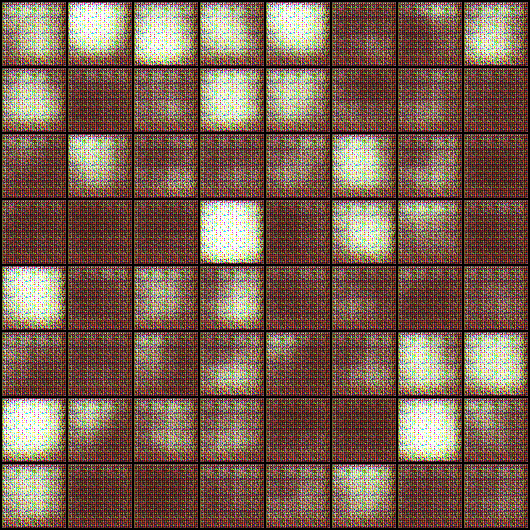

In [53]:
Image('./generated/generated-images-0001.png')

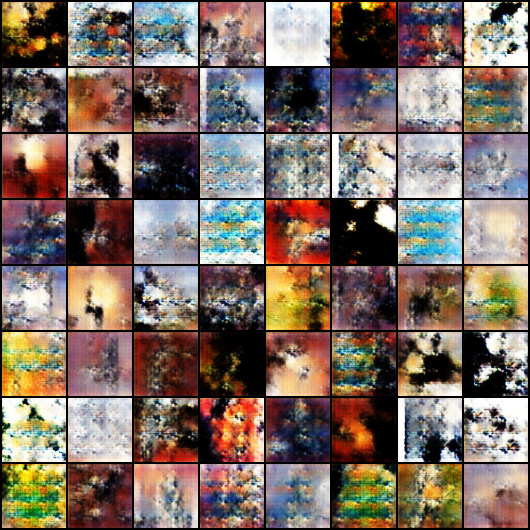

In [54]:
Image('./generated/generated-images-0031.png')

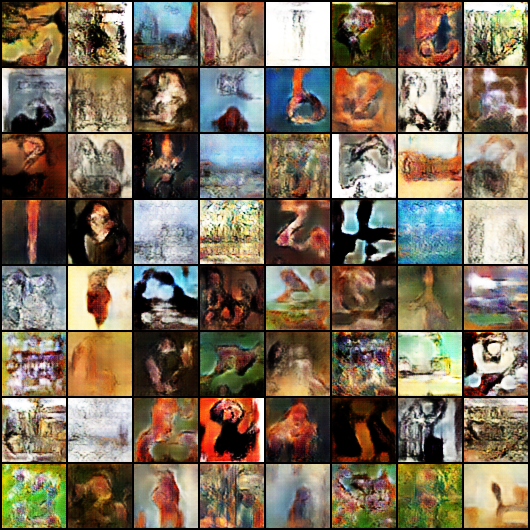

In [55]:
Image('./generated/generated-images-0090.png')

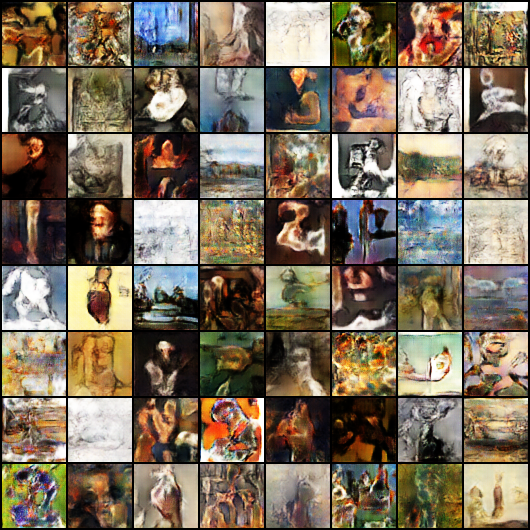

In [56]:
Image('./generated/generated-images-0141.png')

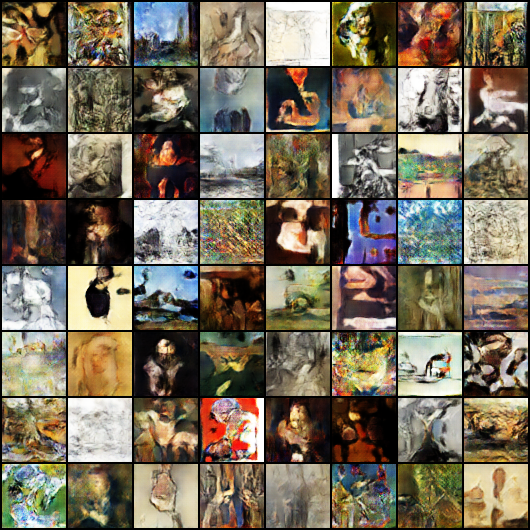

In [57]:
Image('./generated/generated-images-0201.png')

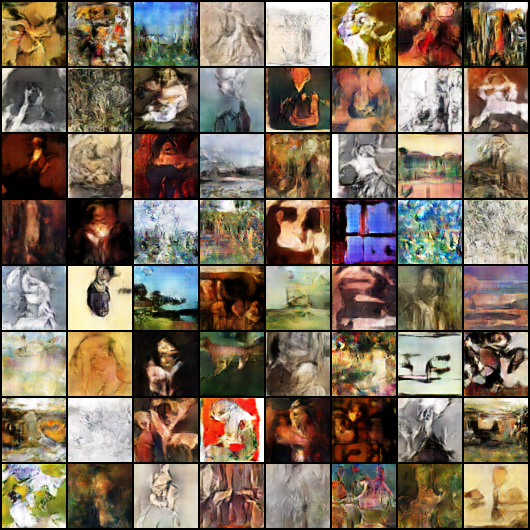

In [58]:
Image('./generated/generated-images-0241.png')

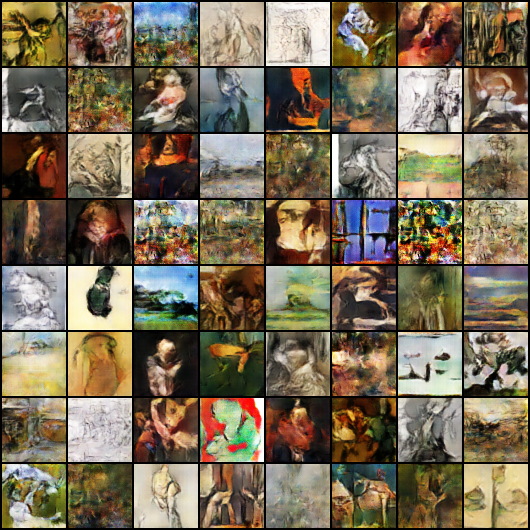

In [59]:
Image('./generated/generated-images-0281.png')

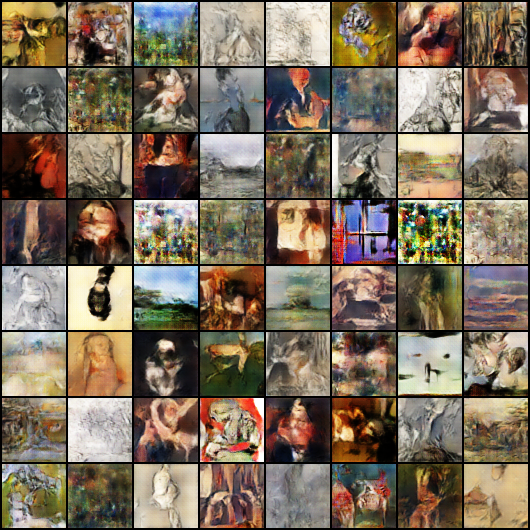

In [60]:
Image('./generated/generated-images-0300.png')

#Results
1. Make a video on generative pictures.
2. Graphs

In [62]:
import cv2
import os

vid_fname = 'art_gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 5, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'avi / AVI (Audio Video Interleaved)'
OpenCV: FFMPEG: fallback to use tag 0x34504d46/'FMP4'


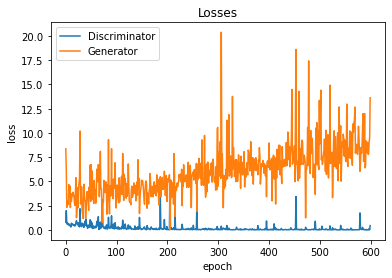

In [63]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

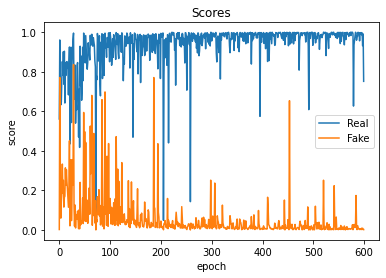

In [64]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

#Conclusion
Here we are seeing that the fake pictures quality is good but fake images prediction values are not very good.So now again we can run it using lower learning rate(lr) and near about 80-100 epoches may be able to increase the fake images prediction value.
 